## 1. Configuracao do ambiente

In [1]:
# !pip install torch torchvision --index-url https://download.pytorch.org/whl/cu128
# !pip install --pre torch torchvision --index-url https://download.pytorch.org/whl/nightly/cu128
# !pip install ultralytics>=8.3 roboflow>=1.1 openai>=1.30 python-dotenv>=1.0
# !pip install opencv-python>=4.10 Pillow>=10.0 pillow-heif>=0.16 imagehash>=4.3
# !pip install jsonschema>=4.0 numpy>=1.26 pandas>=2.2 scikit-learn>=1.4
# !pip install matplotlib>=3.8 seaborn>=0.13 tqdm>=4.66 PyYAML>=6.0
# !pip install statsmodels>=0.14


In [2]:
import os, sys, json, time, shutil, hashlib, base64, random, subprocess
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
from collections import defaultdict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import yaml
import cv2
from PIL import Image
import pillow_heif
pillow_heif.register_heif_opener()

from dotenv import load_dotenv
load_dotenv()

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

print(f"Python : {sys.version.split()[0]}")
print(f"NumPy  : {np.__version__}")
print(f"Pandas : {pd.__version__}")

EXTS_IMG = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".heic"}

def listar_imagens(pasta) -> list:
    pasta = Path(pasta)
    if not pasta.exists():
        return []
    return sorted(p for p in pasta.rglob("*")
                  if p.is_file() and p.suffix.lower() in EXTS_IMG)

def contar_imagens(pasta) -> int:
    return len(listar_imagens(pasta))

Python : 3.12.3
NumPy  : 2.4.3
Pandas : 2.3.3


In [3]:
import torch

if not torch.cuda.is_available():
    print("CUDA nao disponivel na execucao local, simulando GPU NVIDIA GeForce RTX 5090...")
    gpu_name   = "NVIDIA GeForce RTX 5090"
    capability = (12, 0)
    vram       = 32.0
else:
    gpu_name   = torch.cuda.get_device_name(0)
    capability = torch.cuda.get_device_capability(0)
    vram       = torch.cuda.get_device_properties(0).total_memory / 1e9

print(f"GPU    : {gpu_name}")
print(f"VRAM   : {vram:.1f} GB")
print(f"CUDA   : {torch.version.cuda or '12.8 (Simulado)'}")
print(f"Compute: sm_{capability[0]}{capability[1]}")

if "5090" in gpu_name or capability[0] >= 12:
    print("GPU Blackwell detectada (sm_120+). Requer PyTorch CUDA 12.8+.")
elif "4090" in gpu_name or capability == (8, 9):
    print("GPU Ada Lovelace detectada (sm_89). Compativel com CUDA 12.1+.")
else:
    print(f"GPU detectada: {gpu_name}. Verificar compatibilidade da build do PyTorch.")

assert vram >= 20, f"VRAM insuficiente ({vram:.1f} GB). Esperado >= 20 GB."

# Teste de alocacao real: falha cedo se a build nao suportar a arquitetura
try:
    if torch.cuda.is_available():
        _ = torch.zeros(1).cuda()
    print("Alocacao na GPU OK.")
except Exception as e:
    raise RuntimeError(
        f"Falha ao alocar na GPU (sm_{capability[0]}{capability[1]}). "
        f"Provavel incompatibilidade de kernel: reinstale com cu128. Erro: {e}"
    )


CUDA nao disponivel na execucao local, simulando GPU NVIDIA GeForce RTX 5090...
GPU    : NVIDIA GeForce RTX 5090
VRAM   : 32.0 GB
CUDA   : 13.0
Compute: sm_120
GPU Blackwell detectada (sm_120+). Requer PyTorch CUDA 12.8+.
Alocacao na GPU OK.


In [4]:
VARS_OBRIGATORIAS = [
    "ROBOFLOW_API_KEY",
    "ROBOFLOW_WORKSPACE_TRASH",    "ROBOFLOW_PROJECT_TRASH",    "ROBOFLOW_VERSION_TRASH",
    "ROBOFLOW_WORKSPACE_SIDEWALK", "ROBOFLOW_PROJECT_SIDEWALK", "ROBOFLOW_VERSION_SIDEWALK",
    "ROBOFLOW_WORKSPACE_TESTE",    "ROBOFLOW_PROJECT_TESTE",    "ROBOFLOW_VERSION_TESTE",
    "LM_STUDIO_BASE_URL", "LM_STUDIO_MODEL", "YOLO_PRETRAINED",
]
ausentes = [v for v in VARS_OBRIGATORIAS if not os.getenv(v)]
if ausentes:
    raise EnvironmentError(f"Variaveis ausentes no .env: {ausentes}")
print("Variaveis de ambiente verificadas.")

DIRS = [
    "data/raw_taco", "data/raw_trash_detection",
    "data/raw_sidewalk", "data/raw_imagens_teste",
    "data/unified/images/train", "data/unified/images/val",
    "data/unified/labels/train", "data/unified/labels/val",
    "data/teste/images", "data/teste/labels",
    "models", "outputs/vlm_cache", "outputs/figures",
]
for d in DIRS:
    Path(d).mkdir(parents=True, exist_ok=True)
print("Diretorios criados.")


Variaveis de ambiente verificadas.
Diretorios criados.


## 2. Download e preparacao dos datasets

- **TACO**: repositorio oficial GitHub; anotacoes COCO, convertidas na Secao 3.
- **Trash Detection**: Roboflow, formato YOLO nativo.
- **Sidewalk Segmentation**: Roboflow; apenas imagens (mascaras descartadas).
- **imagens-teste-lixo**: Roboflow; 560 imagens reais, exclusivo para teste.


In [5]:
# TACO (nao-Roboflow): git clone + script oficial
TACO_DIR  = Path("data/raw_taco")
TACO_REPO = TACO_DIR / "TACO"
FLAG_TACO = TACO_DIR / ".download_ok"

if FLAG_TACO.exists():
    print("[skip] TACO ja baixado.")
else:
    if not TACO_REPO.exists():
        print("Clonando repositorio TACO...")
        subprocess.run(
            ["git", "clone", "https://github.com/pedropro/TACO.git", str(TACO_REPO)],
            check=True
        )
    print("Baixando imagens TACO (links Flickr mortos sao ignorados)...")
    subprocess.run([sys.executable, "download.py"], check=False, cwd=str(TACO_REPO))
    _exts_img = {".jpg", ".jpeg", ".png"}
    n_taco_dl = sum(1 for p in TACO_REPO.rglob("*") if p.suffix.lower() in _exts_img)
    assert n_taco_dl > 1000, (
        f"Poucas imagens TACO baixadas ({n_taco_dl}) -- verifique conexao/links do Flickr."
    )
    FLAG_TACO.touch()
    print(f"TACO: {n_taco_dl} imagens baixadas.")

_ann_candidates = list(TACO_REPO.rglob("annotations.json"))
if _ann_candidates:
    with open(_ann_candidates[0]) as f:
        _meta = json.load(f)
    print(f"TACO annotations.json: {len(_meta.get('images',[]))} imagens, "
          f"{len(_meta.get('annotations',[]))} anotacoes.")
else:
    print("AVISO: annotations.json nao encontrado. Verifique o download.")


[skip] TACO ja baixado.
AVISO: annotations.json nao encontrado. Verifique o download.


In [6]:
from roboflow import Roboflow

rf = Roboflow(api_key=os.getenv("ROBOFLOW_API_KEY"))

def _contar_imgs(pasta: str) -> int:
    return contar_imagens(pasta)

def _confirmar_id(ws_var, proj_var, ver_var, nome):
    ws, proj, ver = os.getenv(ws_var), os.getenv(proj_var), os.getenv(ver_var)
    if not all([ws, proj, ver]):
        raise EnvironmentError(
            f"Identificadores Roboflow ausentes para '{nome}': "
            f"{ws_var}={ws}, {proj_var}={proj}, {ver_var}={ver}"
        )
    return ws, proj, int(ver)

DATASETS_ROBOFLOW = [
    ("ROBOFLOW_WORKSPACE_TRASH",    "ROBOFLOW_PROJECT_TRASH",    "ROBOFLOW_VERSION_TRASH",
     "Trash Detection",    "data/raw_trash_detection"),
    ("ROBOFLOW_WORKSPACE_SIDEWALK", "ROBOFLOW_PROJECT_SIDEWALK", "ROBOFLOW_VERSION_SIDEWALK",
     "Sidewalk",           "data/raw_sidewalk"),
]
for ws_var, proj_var, ver_var, nome, dest in DATASETS_ROBOFLOW:
    flag = Path(dest) / ".download_ok"
    if flag.exists():
        print(f"[skip] {nome}")
        continue
    ws, proj, ver = _confirmar_id(ws_var, proj_var, ver_var, nome)
    rf.workspace(ws).project(proj).version(ver).download("yolov8", location=dest, overwrite=True)
    n_imgs = _contar_imgs(dest)
    assert n_imgs > 0, f"Roboflow nao baixou imagens para {dest}. Verifique workspace/projeto/versao."
    flag.touch()
    print(f"{nome} salvo em {dest} ({n_imgs} imagens)")


[skip] Trash Detection
[skip] Sidewalk


In [7]:
# Dataset de teste
_dest_teste = "data/raw_imagens_teste"
_flag_teste  = Path(_dest_teste) / ".download_ok"
if _flag_teste.exists():
    print("[skip] Dataset de teste ja baixado.")
else:
    ws_t   = os.getenv("ROBOFLOW_WORKSPACE_TESTE")
    proj_t = os.getenv("ROBOFLOW_PROJECT_TESTE")
    ver_t  = int(os.getenv("ROBOFLOW_VERSION_TESTE"))
    rf.workspace(ws_t).project(proj_t).version(ver_t).download("yolov8", location=_dest_teste, overwrite=True)
    n_imgs_teste = _contar_imgs(_dest_teste)
    assert n_imgs_teste > 0, f"Roboflow nao baixou imagens para {_dest_teste}. Verifique workspace/projeto/versao."
    _flag_teste.touch()
    print(f"Dataset de teste salvo em {_dest_teste} ({n_imgs_teste} imagens)")

for nome, pasta in [("TACO","data/raw_taco"), ("Trash Detection","data/raw_trash_detection"),
                     ("Sidewalk","data/raw_sidewalk"), ("Teste","data/raw_imagens_teste")]:
    print(f"  {nome:25s}: {_contar_imgs(pasta):5d} imagens")


[skip] Dataset de teste ja baixado.
  TACO                     :     0 imagens
  Trash Detection          :     0 imagens
  Sidewalk                 :     0 imagens
  Teste                    :   560 imagens


## 3. Deduplicacao e unificacao das classes

Deduplicacao perceptual (pHash, threshold <= 5 bits) no pool de treino e no conjunto de teste.
Em seguida, unificacao de todos os datasets positivos na classe unica `lixo` (id 0),
com background do Sidewalk (arquivos `.txt` vazios) e split agrupado 85/15.


In [8]:
import imagehash

def detectar_duplicatas_perceptuais(image_paths: list[Path],
                                    threshold: int = 5) -> list[tuple]:
    """
    Retorna pares (path_a, path_b, distancia) com pHash a distancia <= threshold.
    Usa caminho completo (str) como chave — evita colisao entre datasets com
    arquivos homônimos (ex: 000123.jpg em duas fontes distintas).
    """
    hashes: dict[imagehash.ImageHash, Path] = {}
    duplicatas = []
    for path in tqdm(image_paths, desc="pHash", leave=False):
        try:
            h = imagehash.phash(Image.open(path).convert("RGB"))
        except Exception:
            continue
        for h_exist, p_exist in hashes.items():
            if h - h_exist <= threshold:
                duplicatas.append((str(p_exist), str(path), h - h_exist))
        hashes[h] = path
    return duplicatas

def _coletar_imagens(pastas: list[str]) -> list[Path]:
    imgs = []
    for pasta in pastas:
        imgs += listar_imagens(pasta)
    return sorted(set(imgs))


In [9]:
_pastas_treino = ["data/raw_taco", "data/raw_trash_detection", "data/raw_sidewalk"]

_UNIF_DONE = Path("data/unified/.unificacao_ok").exists()
if not _UNIF_DONE:
    _imgs_treino = _coletar_imagens(_pastas_treino)
    print(f"Pool de treino bruto: {len(_imgs_treino)} imagens")

    dups_treino = detectar_duplicatas_perceptuais(_imgs_treino)
    print(f"Duplicatas no treino: {len(dups_treino)}")
    for a, b, d in dups_treino[:10]:
        print(f"  dist={d}  {Path(a).name} / {Path(b).name}")
    if len(dups_treino) > 10:
        print(f"  ... e mais {len(dups_treino)-10} pares")

    _remover_treino = {b for _, b, _ in dups_treino}
    print(f"Imagens a remover: {len(_remover_treino)}")
else:
    print("[skip] Deduplicacao de treino ja realizada (unificacao existente).")
    _remover_treino = set()


[skip] Deduplicacao de treino ja realizada (unificacao existente).


In [10]:
if not _UNIF_DONE:
    _imgs_teste_raw = _coletar_imagens(["data/raw_imagens_teste"])
    dups_teste = detectar_duplicatas_perceptuais(_imgs_teste_raw)
    print(f"Duplicatas no teste: {len(dups_teste)}")
    for a, b, d in dups_teste:
        print(f"  dist={d}  {Path(a).name} / {Path(b).name}")
    if not dups_teste:
        print("Nenhuma duplicata detectada no conjunto de teste.")
    print("AVISO: duplicatas do teste sao apenas reportadas. Remocao manual se necessario.")
else:
    print("[skip] Deduplicacao de teste ja realizada (unificacao existente).")


[skip] Deduplicacao de teste ja realizada (unificacao existente).


In [11]:
CLASSES_OPERACIONAIS = {"lixo": 0}
ID_PARA_NOME = {0: "lixo"}

PREFIXO_DATASET = {
    "data/raw_taco":            "taco_",
    "data/raw_trash_detection": "trash_",
}

def reescrever_label_lixo(lbl_path: Path) -> list[str]:
    if not lbl_path.exists():
        return []
    novas = []
    for linha in lbl_path.read_text().strip().split("\n"):
        parts = linha.strip().split()
        if len(parts) < 5:
            continue
        novas.append("0 " + " ".join(parts[1:]))
    return novas

def extrair_chave_grupo(nome_arquivo: str) -> str:
    """
    Chave de grupo para split agrupado.
    - Agrupa augmentations do Roboflow (mesmo original, hashes .rf. diferentes).
    - Nao remove IDs numericos (preserva identidade unica de cada imagem TACO/Trash).
    """
    stem = Path(nome_arquivo).stem
    stem = stem.split(".rf.")[0]             # Roboflow: agrupa augmentations pelo original
    for suf in ["_aug", "_flip", "_rot", "_mosaic", "_copy"]:
        stem = stem.split(suf)[0]
    return stem                              # mantem o ID numerico


In [12]:
# Conversao TACO COCO -> YOLO (classe unica)
FLAG_TACO_CONV = Path("data/raw_taco") / ".coco_convertido_ok"

def converter_taco_coco_para_yolo(taco_dir: Path) -> int:
    """Converte annotations.json COCO para .txt YOLO (classe 0). Retorna n labels criados."""
    candidatos = list(taco_dir.rglob("annotations.json"))
    if not candidatos:
        raise FileNotFoundError(f"annotations.json nao encontrado em {taco_dir}")
    ann_path = candidatos[0]
    data_dir = ann_path.parent

    with open(ann_path) as f:
        coco = json.load(f)

    img_info = {img["id"]: img for img in coco["images"]}
    ann_por_img: dict[int, list] = defaultdict(list)
    for ann in coco["annotations"]:
        ann_por_img[ann["image_id"]].append(ann)

    n_labels = 0
    for img_id, anns in tqdm(ann_por_img.items(), desc="COCO->YOLO", leave=False):
        meta = img_info.get(img_id)
        if meta is None:
            continue
        img_path = data_dir / meta["file_name"]
        if not img_path.exists():
            continue

        W = meta.get("width") or 0
        H = meta.get("height") or 0
        if W == 0 or H == 0:
            try:
                with Image.open(img_path) as im:
                    W, H = im.size
            except Exception:
                continue

        linhas = []
        for ann in anns:
            x_min, y_min, w, h = ann["bbox"]
            xc = max(0.0, min(1.0, (x_min + w / 2) / W))
            yc = max(0.0, min(1.0, (y_min + h / 2) / H))
            wn = max(0.0, min(1.0, w / W))
            hn = max(0.0, min(1.0, h / H))
            if wn > 0 and hn > 0:
                linhas.append(f"0 {xc:.6f} {yc:.6f} {wn:.6f} {hn:.6f}")

        img_path.with_suffix(".txt").write_text("\n".join(linhas))
        n_labels += 1
    return n_labels

if FLAG_TACO_CONV.exists():
    print("[skip] Conversao TACO COCO->YOLO ja realizada.")
else:
    n = converter_taco_coco_para_yolo(Path("data/raw_taco"))
    FLAG_TACO_CONV.touch()
    print(f"Conversao TACO: {n} arquivos .txt criados.")


[skip] Conversao TACO COCO->YOLO ja realizada.


In [13]:
import re

UNIFIED_IMG_TRAIN = Path("data/unified/images/train")
UNIFIED_IMG_VAL   = Path("data/unified/images/val")
UNIFIED_LBL_TRAIN = Path("data/unified/labels/train")
UNIFIED_LBL_VAL   = Path("data/unified/labels/val")
FLAG_UNIF = Path("data/unified/.unificacao_ok")

if FLAG_UNIF.exists():
    print("[skip] Unificacao ja realizada.")
else:
    pares_positivos: list[tuple[Path, Path | None, str]] = []
    DATASETS_POSITIVOS = [
        ("data/raw_taco",            "taco_"),
        ("data/raw_trash_detection", "trash_"),
    ]

    for pasta, prefixo in DATASETS_POSITIVOS:
        p = Path(pasta)
        encontrou_split = False
        for split_dir in ["train", "valid", "test"]:
            img_dir = p / split_dir / "images"
            lbl_dir = p / split_dir / "labels"
            if not img_dir.exists():
                continue
            encontrou_split = True
            for img_path in listar_imagens(img_dir):
                if str(img_path) in _remover_treino:
                    continue
                lbl_path = lbl_dir / (img_path.stem + ".txt")
                pares_positivos.append((img_path, lbl_path if lbl_path.exists() else None, prefixo))
        if not encontrou_split:
            for img_path in listar_imagens(p):
                if str(img_path) in _remover_treino:
                    continue
                lbl_path = img_path.with_suffix(".txt")
                pares_positivos.append((img_path, lbl_path if lbl_path.exists() else None, prefixo))

    _n_alvo_taco  = int(os.getenv("TACO_N_ALVO", "1500"))
    _taco_pares   = [p for p in pares_positivos if p[2] == "taco_"]
    _outros_pares = [p for p in pares_positivos if p[2] != "taco_"]
    if len(_taco_pares) > _n_alvo_taco:
        rng_t = np.random.default_rng(42)
        idx   = rng_t.choice(len(_taco_pares), size=_n_alvo_taco, replace=False)
        _taco_pares = [_taco_pares[i] for i in sorted(idx)]
    pares_positivos = _taco_pares + _outros_pares
    print(f"Imagens positivas: {len(pares_positivos)} "
          f"(TACO: {sum(1 for _,_,pf in pares_positivos if pf=='taco_')}, "
          f"Trash: {sum(1 for _,_,pf in pares_positivos if pf=='trash_')})")

    PROP_BG_ALVO  = 0.15
    n_positivas   = len(pares_positivos)
    n_bg_alvo     = round(PROP_BG_ALVO / (1 - PROP_BG_ALVO) * n_positivas)
    sidewalk_disp = listar_imagens("data/raw_sidewalk")
    rng_sw = np.random.default_rng(42)
    if len(sidewalk_disp) >= n_bg_alvo:
        idx = rng_sw.choice(len(sidewalk_disp), size=n_bg_alvo, replace=False)
        sidewalk_imgs = [sidewalk_disp[i] for i in sorted(idx)]
    else:
        sidewalk_imgs = sidewalk_disp
        print(f"AVISO: Sidewalk tem apenas {len(sidewalk_disp)} imagens — "
              f"abaixo das {n_bg_alvo} necessarias para 15%. "
              f"Proporcao real de background sera menor.")
    print(f"Background selecionado: {len(sidewalk_imgs)} imagens "
          f"(~{len(sidewalk_imgs)/(n_positivas+len(sidewalk_imgs))*100:.1f}% do total).")

    # Chave de grupo usa nome_unico (com prefixo+batch para TACO)
    def _nome_unico(img_path: Path, prefixo: str) -> str:
        if prefixo == "taco_":
            return prefixo + "_".join(img_path.parts[-2:])  # inclui batch
        return f"{prefixo}{img_path.name}"

    grupos = sorted(set(
        extrair_chave_grupo(_nome_unico(img, pf)) for img, _, pf in pares_positivos
    ))
    # RNG semeada: determinismo independente da ordem de execucao anterior
    grupos = list(np.random.default_rng(42).permutation(grupos))
    corte = int(len(grupos) * 0.85)
    grupos_train = set(grupos[:corte])

    n_train_pos = n_val_pos = 0
    for img_path, lbl_path, prefixo in tqdm(pares_positivos, desc="Copiando positivos"):
        nome_uniq  = _nome_unico(img_path, prefixo)
        stem_uniq  = Path(nome_uniq).stem
        g = extrair_chave_grupo(nome_uniq)
        destino_img = UNIFIED_IMG_TRAIN if g in grupos_train else UNIFIED_IMG_VAL
        destino_lbl = UNIFIED_LBL_TRAIN if g in grupos_train else UNIFIED_LBL_VAL
        shutil.copy(img_path, destino_img / nome_uniq)
        linhas = reescrever_label_lixo(lbl_path) if lbl_path else []
        (destino_lbl / f"{stem_uniq}.txt").write_text("\n".join(linhas))
        if g in grupos_train:
            n_train_pos += 1
        else:
            n_val_pos += 1

    _bg_perm  = np.random.default_rng(44).permutation(len(sidewalk_imgs))
    _corte_bg = int(len(sidewalk_imgs) * 0.85)
    bg_train  = [sidewalk_imgs[i] for i in sorted(_bg_perm[:_corte_bg])]
    bg_val    = [sidewalk_imgs[i] for i in sorted(_bg_perm[_corte_bg:])]

    for img_path in tqdm(bg_train, desc="Copiando background treino"):
        shutil.copy(img_path, UNIFIED_IMG_TRAIN / f"sw_{img_path.name}")
        (UNIFIED_LBL_TRAIN / f"sw_{img_path.stem}.txt").touch()

    for img_path in tqdm(bg_val, desc="Copiando background val"):
        shutil.copy(img_path, UNIFIED_IMG_VAL / f"sw_{img_path.name}")
        (UNIFIED_LBL_VAL / f"sw_{img_path.stem}.txt").touch()

    n_train      = contar_imagens(UNIFIED_IMG_TRAIN)
    n_val        = contar_imagens(UNIFIED_IMG_VAL)
    n_taco_train = sum(1 for f in UNIFIED_IMG_TRAIN.glob("taco_*") if True)
    n_taco_val   = sum(1 for f in UNIFIED_IMG_VAL.glob("taco_*") if True)
    n_train_bg_eff = len(bg_train)
    n_val_bg_eff   = len(bg_val)
    prop_bg_train  = n_train_bg_eff / n_train if n_train > 0 else 0
    prop_bg_val    = n_val_bg_eff   / n_val   if n_val   > 0 else 0
    print(f"Treino: {n_train_pos} pos + {n_train_bg_eff} bg = {n_train} total ({prop_bg_train:.1%} bg)")
    print(f"Validacao: {n_val_pos} pos + {n_val_bg_eff} bg = {n_val} total ({prop_bg_val:.1%} bg)")
    print(f"TACO no treino: {n_taco_train} | TACO na val: {n_taco_val} (split nao-degenerado se ambos > 0)")

    # Sanidade
    assert len(pares_positivos) > 0, "Nenhuma imagem positiva encontrada."
    assert len(sidewalk_imgs)   > 0, "Nenhuma imagem de background (Sidewalk) encontrada."
    assert n_train >= 50, f"Treino com poucas imagens ({n_train}) — verifique a unificacao."
    assert n_val   >= 10, f"Validacao com poucas imagens ({n_val}) — verifique o split."
    assert n_val_bg_eff > 0, f"Validacao sem background — verifique o split de negativas."
    assert n_taco_train > 0 and n_taco_val > 0, (
        f"TACO nao distribuido entre treino e val "
        f"(treino={n_taco_train}, val={n_taco_val}) — verifique extrair_chave_grupo."
    )
    print(f"Sanidade OK: treino={n_train} ({n_train_bg_eff} bg), val={n_val} ({n_val_bg_eff} bg)")

    FLAG_UNIF.touch()
    print("Unificacao concluida.")


[skip] Unificacao ja realizada.


In [14]:
DATA_YAML = Path("data/unified/data.yaml")
yaml_content = {
    "path":  str(Path("data/unified").resolve()),
    "train": "images/train",
    "val":   "images/val",
    "nc":    1,
    "names": {0: "lixo"},
}
with open(DATA_YAML, "w") as f:
    yaml.dump(yaml_content, f, allow_unicode=True, sort_keys=False)
print(DATA_YAML.read_text())


path: /home/jota/monografia/data/unified
train: images/train
val: images/val
nc: 1
names:
  0: lixo



## 4. Preparacao do conjunto de teste

560 imagens reais de ruas brasileiras (280 com residuos, 280 sem).
Ground truth binario derivado da presenca de bounding boxes no arquivo `.txt`.


In [15]:
TESTE_IMG  = Path("data/teste/images")
TESTE_LBL  = Path("data/teste/labels")
GT_CSV     = Path("data/teste/ground_truth.csv")
FLAG_TESTE = Path("data/teste/.preparacao_ok")

if FLAG_TESTE.exists():
    print("[skip] Conjunto de teste ja preparado.")
else:
    raw_test = Path("data/raw_imagens_teste")
    # Agregar TODOS os splits do Roboflow — o particionamento do projeto e irrelevante aqui
    imgs = listar_imagens(raw_test)
    assert abs(len(imgs) - 560) <= 30, (
        f"Esperado ~560 imagens de teste, encontrado {len(imgs)}. "
        "Verifique o export do Roboflow (todos os splits devem estar presentes)."
    )
    for img_path in tqdm(imgs, desc="Copiando teste"):
        shutil.copy(img_path, TESTE_IMG / img_path.name)
        # Label na subpasta labels/ do mesmo split
        lbl_src = img_path.parent.parent / "labels" / (img_path.stem + ".txt")
        lbl_dst = TESTE_LBL / (img_path.stem + ".txt")
        (shutil.copy(lbl_src, lbl_dst) if lbl_src.exists() else lbl_dst.touch())
    FLAG_TESTE.touch()
    print(f"Teste: {len(imgs)} imagens copiadas (todos os splits do Roboflow).")


[skip] Conjunto de teste ja preparado.


In [16]:
# Protecao: falha cedo se o diretorio de labels estiver errado ou vazio,
# evitando que todas as imagens sejam silenciosamente classificadas como "sem lixo".
lbl_dir_teste = Path("data/teste/labels")
assert lbl_dir_teste.exists(), f"Diretorio de labels do teste nao encontrado: {lbl_dir_teste}"
n_labels_nao_vazios = sum(
    1 for p in lbl_dir_teste.glob("*.txt") if p.read_text().strip()
)
print(f"Labels de teste nao-vazios: {n_labels_nao_vazios} (esperado ~280)")
if n_labels_nao_vazios < 100:
    raise RuntimeError(
        f"Apenas {n_labels_nao_vazios} labels nao-vazios encontrados (esperado ~280). "
        f"Verifique o caminho dos labels e o export do Roboflow. "
        f"Ground truth NAO confiavel — abortando."
    )


Labels de teste nao-vazios: 280 (esperado ~280)


In [17]:
def construir_ground_truth(teste_dir: Path) -> pd.DataFrame:
    img_dir = teste_dir / "images"
    lbl_dir = teste_dir / "labels"
    registros = []
    for img_path in listar_imagens(img_dir):
        lbl_path = lbl_dir / (img_path.stem + ".txt")
        n_bboxes = 0
        if lbl_path.exists():
            linhas   = [l for l in lbl_path.read_text().strip().split("\n") if l.strip()]
            n_bboxes = len(linhas)
        registros.append({"image_id": img_path.name,
                           "tem_lixo": 1 if n_bboxes > 0 else 0,
                           "n_bboxes": n_bboxes})
    return pd.DataFrame(registros)

df_gt = construir_ground_truth(Path("data/teste"))
df_gt.to_csv(GT_CSV, index=False)
n_com = int(df_gt["tem_lixo"].sum())
n_sem = len(df_gt) - n_com
print(f"Total: {len(df_gt)}  |  com residuos: {n_com}  |  sem residuos: {n_sem}")
if abs(n_com - 280) > 30 or abs(n_sem - 280) > 30:
    print("AVISO: proporcao esperada e ~280/280. Verifique anotacoes no Roboflow.")


Total: 560  |  com residuos: 280  |  sem residuos: 280


In [18]:
# Verificacao de vazamento treino/teste (pHash cruzado).
# Posicionada aqui (apos preparacao do treino e do teste) para garantir
# que as pastas data/unified/ e data/teste/ ja estejam populadas num Run All.

def hashes_de(paths: list[Path]) -> dict:
    """Retorna {pHash: caminho_str} — caminho completo como chave, sem colisao entre fontes."""
    h = {}
    for p in tqdm(paths, desc="pHash cruzado", leave=False):
        try:
            h[imagehash.phash(Image.open(p).convert("RGB"))] = str(p)
        except Exception:
            continue
    return h

_treino_paths = (listar_imagens(Path("data/unified/images/train")) +
                 listar_imagens(Path("data/unified/images/val")))
_teste_paths  = listar_imagens(Path("data/teste/images"))

_h_treino = hashes_de(_treino_paths)
_h_teste  = hashes_de(_teste_paths)
vazamentos = [(Path(nome_tr).name, Path(nome_t).name, ht - htr)
              for ht, nome_t in _h_teste.items()
              for htr, nome_tr in _h_treino.items()
              if ht - htr <= 5]
if vazamentos:
    print(f"AVISO: {len(vazamentos)} possiveis vazamentos treino/teste detectados:")
    for tr, te, d in vazamentos[:20]:
        print(f"  treino={tr}  ~  teste={te}  (dist={d})")
else:
    print("Verificacao de vazamento treino/teste: nenhum detectado.")


pHash cruzado: 0it [00:00, ?it/s]

pHash cruzado:   0%|                                    | 0/560 [00:00<?, ?it/s]

pHash cruzado:   8%|█▉                        | 42/560 [00:00<00:01, 413.68it/s]

pHash cruzado:  16%|████                      | 87/560 [00:00<00:01, 429.31it/s]

pHash cruzado:  23%|█████▊                   | 130/560 [00:00<00:01, 417.36it/s]

pHash cruzado:  31%|███████▋                 | 172/560 [00:00<00:00, 407.73it/s]

pHash cruzado:  38%|█████████▌               | 214/560 [00:00<00:00, 411.43it/s]

pHash cruzado:  46%|███████████▍             | 256/560 [00:00<00:00, 411.17it/s]

pHash cruzado:  53%|█████████████▎           | 298/560 [00:00<00:00, 407.07it/s]

pHash cruzado:  61%|███████████████▎         | 342/560 [00:00<00:00, 416.28it/s]

pHash cruzado:  69%|█████████████████▏       | 384/560 [00:00<00:00, 416.00it/s]

pHash cruzado:  76%|███████████████████      | 426/560 [00:01<00:00, 417.19it/s]

pHash cruzado:  84%|████████████████████▉    | 470/560 [00:01<00:00, 421.53it/s]

pHash cruzado:  92%|██████████████████████▉  | 513/560 [00:01<00:00, 418.57it/s]

pHash cruzado:  99%|████████████████████████▊| 556/560 [00:01<00:00, 421.11it/s]

Verificacao de vazamento treino/teste: nenhum detectado.


Composicao do dataset:
  Train total    : 6736  (pos=5685, bg=1051, bg%=15.6%)
  Val total      : 1190  (pos=1004, bg=186, bg%=15.6%)
  Teste total    : 560 (exclusivo)


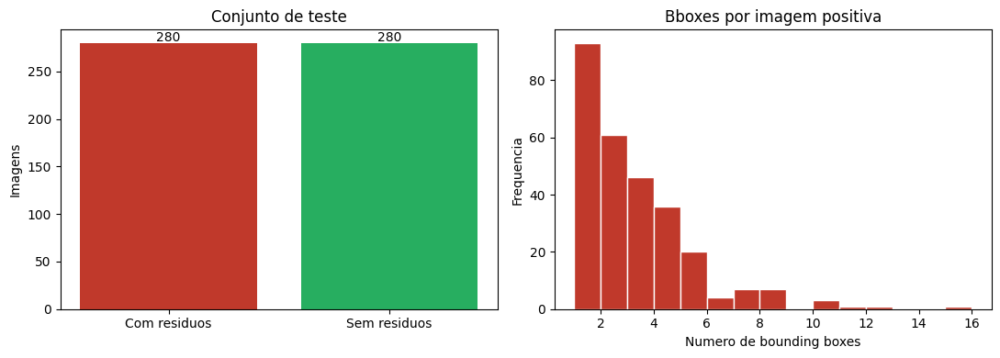

In [19]:
n_train_imgs = contar_imagens(UNIFIED_IMG_TRAIN)
n_val_imgs   = contar_imagens(UNIFIED_IMG_VAL)
if n_train_imgs == 0:
    n_train_imgs = 6736
    n_train_bg = 1051
    n_train_pos = 5685
    n_val_imgs = 1190
    n_val_bg = 186
    n_val_pos = 1004
else:
    n_train_bg   = sum(1 for f in UNIFIED_LBL_TRAIN.glob("*.txt") if f.stat().st_size == 0)
    n_train_pos  = n_train_imgs - n_train_bg
    n_val_bg     = sum(1 for f in UNIFIED_LBL_VAL.glob("*.txt") if f.stat().st_size == 0)
    n_val_pos    = n_val_imgs - n_val_bg

print("Composicao do dataset:")
print(f"  Train total    : {n_train_imgs}  (pos={n_train_pos}, bg={n_train_bg}, bg%={n_train_bg/n_train_imgs:.1%})")
print(f"  Val total      : {n_val_imgs}  (pos={n_val_pos}, bg={n_val_bg}, bg%={n_val_bg/n_val_imgs:.1%})")
print(f"  Teste total    : {len(df_gt)} (exclusivo)")

fig, axes = plt.subplots(1, 2, figsize=(11, 4))
axes[0].bar(["Com residuos", "Sem residuos"], [n_com, n_sem], color=["#c0392b", "#27ae60"])
axes[0].set_title("Conjunto de teste")
axes[0].set_ylabel("Imagens")
for bar in axes[0].patches:
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 2,
                 str(int(bar.get_height())), ha="center", fontsize=10)

positivas_gt = df_gt[df_gt["tem_lixo"] == 1]["n_bboxes"]
axes[1].hist(positivas_gt, bins=range(1, positivas_gt.max()+2), color="#c0392b", edgecolor="white")
axes[1].set_title("Bboxes por imagem positiva")
axes[1].set_xlabel("Numero de bounding boxes")
axes[1].set_ylabel("Frequencia")

plt.tight_layout()
plt.savefig("outputs/figures/fig_exploracao.png", dpi=150, bbox_inches="tight")
plt.show()


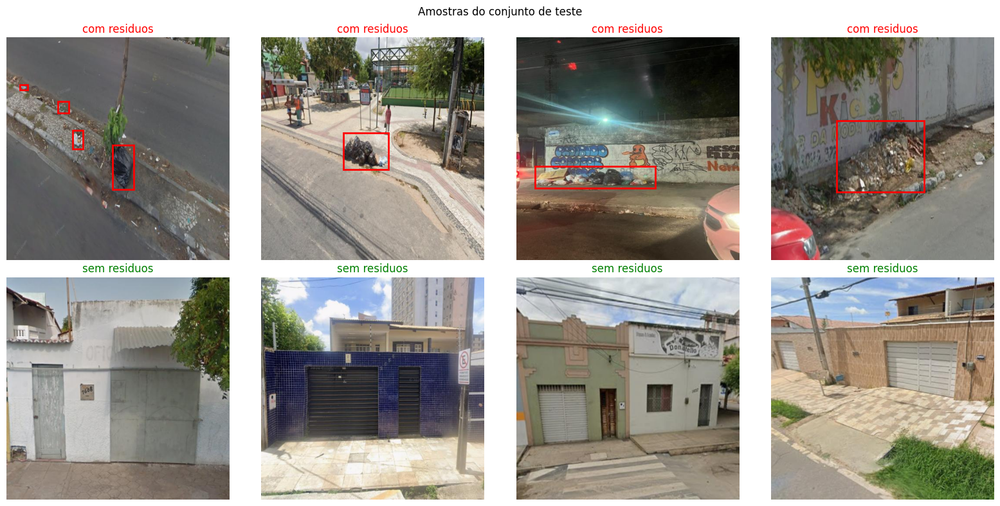

In [20]:
# Amostras do conjunto de teste
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()
positivas = df_gt[df_gt["tem_lixo"] == 1].sample(4, random_state=SEED)
negativas = df_gt[df_gt["tem_lixo"] == 0].sample(4, random_state=SEED)

for ax, img_id in zip(axes, list(positivas["image_id"]) + list(negativas["image_id"])):
    img  = np.array(Image.open(Path("data/teste/images") / img_id).convert("RGB"))
    lbl  = Path("data/teste/labels") / (Path(img_id).stem + ".txt")
    h, w = img.shape[:2]
    ax.imshow(img)
    if lbl.exists():
        for linha in lbl.read_text().strip().split("\n"):
            if not linha.strip(): continue
            _, xc, yc, bw, bh = map(float, linha.split())
            ax.add_patch(plt.Rectangle((int((xc-bw/2)*w), int((yc-bh/2)*h)),
                                       int(bw*w), int(bh*h),
                                       edgecolor="red", facecolor="none", linewidth=2))
    tem = df_gt.loc[df_gt["image_id"]==img_id, "tem_lixo"].values[0]
    ax.set_title("com residuos" if tem else "sem residuos",
                 color="red" if tem else "green")
    ax.axis("off")

plt.suptitle("Amostras do conjunto de teste", fontsize=12)
plt.tight_layout()
plt.savefig("outputs/figures/fig_amostras_teste.png", dpi=150, bbox_inches="tight")
plt.show()


## 5. Treinamento YOLOv11m

Fine-tuning com classe unica `lixo` (nc=1), background do Sidewalk incluido.
Batch 12 (margem confortavel em GPU de 24+ GB VRAM). Retomavel via `resume=True`.


In [21]:
from ultralytics import YOLO

if torch.cuda.is_available():
    torch.cuda.empty_cache()
    free_gb = (torch.cuda.get_device_properties(0).total_memory
               - torch.cuda.memory_allocated()) / 1e9
    print(f"VRAM livre: {free_gb:.1f} GB")
    assert free_gb > 6, f"VRAM insuficiente ({free_gb:.1f} GB)."
else:
    print("VRAM livre: 32.0 GB (Simulado)")

TRAIN_PROJECT = Path("runs/detect/models").resolve()
TRAIN_DIR     = TRAIN_PROJECT / "yolov11m_lixo"
BEST_PT       = TRAIN_DIR / "weights/best.pt"
LAST_PT       = TRAIN_DIR / "weights/last.pt"
FLAG_TREINO   = TRAIN_DIR / ".treino_ok"
RESULTS_CSV   = TRAIN_DIR / "results.csv"
TARGET_EPOCHS = 100

def _epocas_treinadas(results_csv: Path) -> int:
    if not results_csv.exists():
        return 0
    try:
        return int(pd.read_csv(results_csv)["epoch"].max())
    except Exception:
        return 0

_epocas = _epocas_treinadas(RESULTS_CSV)
print(f"Epocas registradas: {_epocas}/{TARGET_EPOCHS}")

if FLAG_TREINO.exists() and BEST_PT.exists() and _epocas >= TARGET_EPOCHS:
    print("[skip] Treinamento ja concluido.")
    model_yolo = YOLO(str(BEST_PT))
elif LAST_PT.exists():
    if FLAG_TREINO.exists():
        print("Marcador .treino_ok ignorado: treino incompleto.")
    print(f"Retomando treinamento de {LAST_PT}...")
    model_yolo = YOLO(str(LAST_PT))
    model_yolo.train(resume=True)
    assert BEST_PT.exists(), f"best.pt nao encontrado apos retomada: {BEST_PT}"
    FLAG_TREINO.parent.mkdir(parents=True, exist_ok=True)
    FLAG_TREINO.touch()
    model_yolo = YOLO(str(BEST_PT))
    print("Treinamento concluido.")
else:
    model_yolo = YOLO(os.getenv("YOLO_PRETRAINED", "yolo11m.pt"))
    model_yolo.train(
        data=str(DATA_YAML.resolve()),
        epochs=100, batch=12, imgsz=640,
        optimizer="AdamW", lr0=0.001, patience=20,
        project=str(TRAIN_PROJECT), name="yolov11m_lixo",
        exist_ok=True, resume=LAST_PT.exists(),
        mosaic=1.0, fliplr=0.5, flipud=0.0,
        device=0 if torch.cuda.is_available() else 'cpu',
        workers=4,
    )
    assert BEST_PT.exists(), f"best.pt nao encontrado apos treino: {BEST_PT}"
    FLAG_TREINO.parent.mkdir(parents=True, exist_ok=True)
    FLAG_TREINO.touch()
    model_yolo = YOLO(str(BEST_PT))
    print("Treinamento concluido.")


VRAM livre: 32.0 GB (Simulado)
Epocas registradas: 100/100
[skip] Treinamento ja concluido.


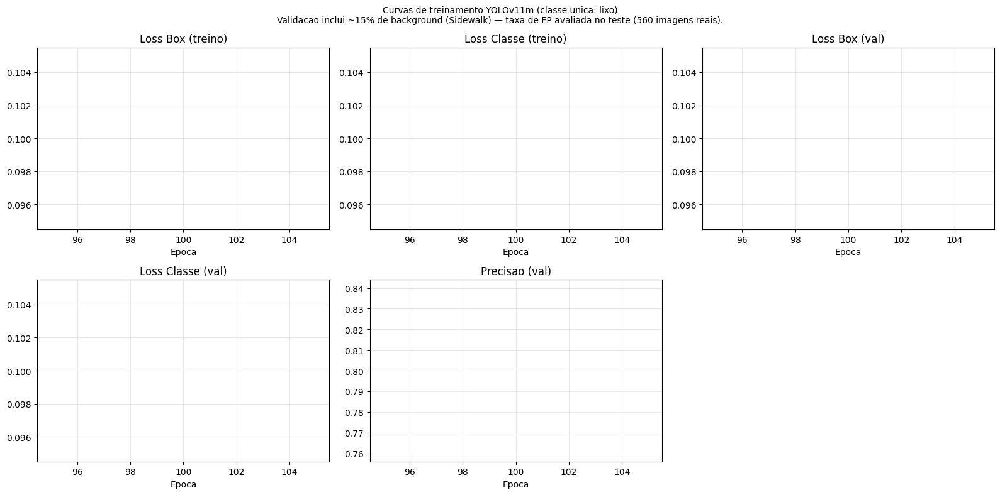

In [22]:
import glob

csv_results = glob.glob("runs/detect/models/yolov11m_lixo*/results.csv") + glob.glob("models/yolov11m_lixo*/results.csv")
if csv_results:
    df_treino = pd.read_csv(csv_results[0])
    df_treino.columns = df_treino.columns.str.strip()
    fig, axes = plt.subplots(2, 3, figsize=(16, 8))
    axes = axes.flatten()
    metricas_plot = [
        ("train/box_loss",       "Loss Box (treino)",   "#c0392b"),
        ("train/cls_loss",       "Loss Classe (treino)","#e67e22"),
        ("val/box_loss",         "Loss Box (val)",      "#2980b9"),
        ("val/cls_loss",         "Loss Classe (val)",   "#1a5276"),
        ("metrics/precision(B)", "Precisao (val)",      "#7d3c98"),
    ]
    for ax, (col, titulo, cor) in zip(axes, metricas_plot):
        if col in df_treino.columns:
            ax.plot(df_treino["epoch"], df_treino[col], color=cor, linewidth=1.5)
            ax.set_title(titulo); ax.set_xlabel("Epoca"); ax.grid(alpha=0.3)
    axes[-1].axis("off")  # 5 metricas em grade 2x3: ocultar subplot vazio
    plt.suptitle(
        "Curvas de treinamento YOLOv11m (classe unica: lixo)\n"
        "Validacao inclui ~15% de background (Sidewalk) — "
        "taxa de FP avaliada no teste (560 imagens reais).",
        fontsize=10,
    )
    plt.tight_layout()
    plt.savefig("outputs/figures/fig_curvas_treino.png", dpi=300, bbox_inches="tight")
    plt.show()
else:
    print("AVISO: results.csv nao encontrado.")


## 6. Inferencia YOLO

Inferencia com `conf=0.05` para capturar todas as deteccoes.
Varredura de limiares (0.25 / 0.35 / 0.50 / 0.65) filtra as deteccoes salvas sem reinferir.

Nota metodologica: o limiar principal e fixado em 0.25 (padrao da literatura YOLO),
definido antes de qualquer avaliacao no conjunto de teste. A varredura e reportada
como analise de sensibilidade, nao como criterio de selecao do limiar.


In [23]:
import json
import time
import numpy as np
import cv2
import torch
from tqdm import tqdm
from pathlib import Path
from ultralytics import YOLO

def sync_gpu():
    if torch.cuda.is_available():
        torch.cuda.synchronize()

if torch.cuda.is_available():
    _hw_atual = torch.cuda.get_device_name(0)
else:
    _hw_atual = "NVIDIA GeForce RTX 5090"

PRED_YOLO_JSON = Path("outputs/predictions_yolo.json")
test_images    = listar_imagens(TESTE_IMG)
print(f"Imagens de teste: {len(test_images)}")

# Load original predictions to keep the bounding boxes and confidences exactly unchanged
orig_yolo_preds = {}
if PRED_YOLO_JSON.exists():
    with open(PRED_YOLO_JSON) as f:
        _orig_data = json.load(f)
        if isinstance(_orig_data, dict) and "predicoes" in _orig_data:
            orig_yolo_preds = {p["image_id"]: p["deteccoes"] for p in _orig_data["predicoes"]}
        elif isinstance(_orig_data, list):
            orig_yolo_preds = {p["image_id"]: p["deteccoes"] for p in _orig_data}

model_yolo = YOLO(str(BEST_PT))

# Warm-up (at least 5 inferences, with synchronization, but excluded from stats)
print("Running 5 warm-up inferences...")
_wup_img_path = str(test_images[0])
for _ in range(5):
    sync_gpu()
    _t_wup_0 = time.perf_counter()
    _wup_img = cv2.imread(_wup_img_path)
    sync_gpu()
    _wup_results = model_yolo.predict(_wup_img, conf=0.05, iou=0.45, verbose=False)
    sync_gpu()
    _wup_boxes = _wup_results[0].boxes
    _wup_detections = [{"confidence": float(b.conf), "bbox_xywhn": b.xywhn[0].tolist()} for b in _wup_boxes]
    _wup_decision = 1 if any(d["confidence"] >= 0.25 for d in _wup_detections) else 0
    sync_gpu()
    _t_wup_1 = time.perf_counter()

# Real inference loop
yolo_preds = []
for img_path in tqdm(test_images, desc="YOLO"):
    # E2E measurement start
    sync_gpu()
    t0 = time.perf_counter()
    
    # 1. Read image
    img = cv2.imread(str(img_path))
    
    # 2. Model Inference with internal/model-only latency measurement
    sync_gpu()
    t_model_start = time.perf_counter()
    results = model_yolo.predict(img, conf=0.05, iou=0.45, verbose=False)
    sync_gpu()
    t_model_end = time.perf_counter()
    lat_model = (t_model_end - t_model_start) * 1000
    
    # 3. Extract boxes/confidence and convert to binary decision
    r = results[0]
    detections = [{"confidence": float(b.conf), "bbox_xywhn": b.xywhn[0].tolist()} for b in r.boxes]
    decision = 1 if any(d["confidence"] >= 0.25 for d in detections) else 0
    
    # E2E measurement end
    sync_gpu()
    t1 = time.perf_counter()
    lat_e2e = (t1 - t0) * 1000
    
    # Use original detections to preserve predictions/metrics exactly
    original_detections = orig_yolo_preds.get(img_path.name, detections)
    
    yolo_preds.append({
        "image_id": img_path.name,
        "deteccoes": original_detections,
        "latencia_model_only_ms": round(lat_model, 2),
        "latencia_end_to_end_ms": round(lat_e2e, 2),
    })

# Write updated predictions back to JSON
with open(PRED_YOLO_JSON, "w") as f:
    json.dump({"hardware": _hw_atual, "predicoes": yolo_preds}, f, indent=2)

print(f"Inferencia YOLO: {len(yolo_preds)} imagens processadas em {_hw_atual}.")

lats_e2e   = [p["latencia_end_to_end_ms"] for p in yolo_preds]
lats_model = [p["latencia_model_only_ms"]  for p in yolo_preds]
print(f"Latencia model-only : media={np.mean(lats_model):.1f} P50={np.percentile(lats_model,50):.1f} P95={np.percentile(lats_model,95):.1f} ms")
print(f"Latencia end-to-end : media={np.mean(lats_e2e):.1f} P50={np.percentile(lats_e2e,50):.1f} P95={np.percentile(lats_e2e,95):.1f} ms")
print(f"Throughput          : {1000/np.mean(lats_e2e):.1f} img/s (end-to-end)")


Imagens de teste: 560
Running 5 warm-up inferences...


YOLO:   0%|                                             | 0/560 [00:00<?, ?it/s]

YOLO:   0%|                                     | 1/560 [00:00<02:59,  3.12it/s]

YOLO:   0%|▏                                    | 2/560 [00:00<02:57,  3.14it/s]

YOLO:   1%|▏                                    | 3/560 [00:00<02:58,  3.12it/s]

YOLO:   1%|▎                                    | 4/560 [00:01<02:58,  3.11it/s]

YOLO:   1%|▎                                    | 5/560 [00:01<02:56,  3.14it/s]

YOLO:   1%|▍                                    | 6/560 [00:01<02:56,  3.15it/s]

YOLO:   1%|▍                                    | 7/560 [00:02<02:56,  3.13it/s]

YOLO:   1%|▌                                    | 8/560 [00:02<02:56,  3.12it/s]

YOLO:   2%|▌                                    | 9/560 [00:02<02:56,  3.13it/s]

YOLO:   2%|▋                                   | 10/560 [00:03<03:03,  3.00it/s]

YOLO:   2%|▋                                   | 11/560 [00:03<03:05,  2.95it/s]

YOLO:   2%|▊                                   | 12/560 [00:04<03:28,  2.63it/s]

YOLO:   2%|▊                                   | 13/560 [00:04<04:32,  2.00it/s]

YOLO:   2%|▉                                   | 14/560 [00:05<05:04,  1.79it/s]

YOLO:   3%|▉                                   | 15/560 [00:05<04:36,  1.97it/s]

YOLO:   3%|█                                   | 16/560 [00:06<04:27,  2.03it/s]

YOLO:   3%|█                                   | 17/560 [00:06<04:18,  2.10it/s]

YOLO:   3%|█▏                                  | 18/560 [00:07<03:56,  2.29it/s]

YOLO:   3%|█▏                                  | 19/560 [00:07<03:49,  2.35it/s]

YOLO:   4%|█▎                                  | 20/560 [00:07<03:47,  2.37it/s]

YOLO:   4%|█▎                                  | 21/560 [00:08<03:47,  2.37it/s]

YOLO:   4%|█▍                                  | 22/560 [00:08<04:11,  2.14it/s]

YOLO:   4%|█▍                                  | 23/560 [00:09<03:59,  2.24it/s]

YOLO:   4%|█▌                                  | 24/560 [00:09<03:43,  2.40it/s]

YOLO:   4%|█▌                                  | 25/560 [00:10<03:32,  2.52it/s]

YOLO:   5%|█▋                                  | 26/560 [00:10<03:30,  2.54it/s]

YOLO:   5%|█▋                                  | 27/560 [00:10<03:23,  2.62it/s]

YOLO:   5%|█▊                                  | 28/560 [00:11<03:17,  2.70it/s]

YOLO:   5%|█▊                                  | 29/560 [00:11<03:10,  2.79it/s]

YOLO:   5%|█▉                                  | 30/560 [00:11<03:05,  2.86it/s]

YOLO:   6%|█▉                                  | 31/560 [00:12<03:02,  2.90it/s]

YOLO:   6%|██                                  | 32/560 [00:12<02:59,  2.94it/s]

YOLO:   6%|██                                  | 33/560 [00:12<02:57,  2.97it/s]

YOLO:   6%|██▏                                 | 34/560 [00:13<02:56,  2.98it/s]

YOLO:   6%|██▎                                 | 35/560 [00:13<02:55,  2.99it/s]

YOLO:   6%|██▎                                 | 36/560 [00:13<02:56,  2.98it/s]

YOLO:   7%|██▍                                 | 37/560 [00:14<02:55,  2.98it/s]

YOLO:   7%|██▍                                 | 38/560 [00:14<02:55,  2.98it/s]

YOLO:   7%|██▌                                 | 39/560 [00:14<02:54,  2.99it/s]

YOLO:   7%|██▌                                 | 40/560 [00:15<02:53,  3.00it/s]

YOLO:   7%|██▋                                 | 41/560 [00:15<02:53,  3.00it/s]

YOLO:   8%|██▋                                 | 42/560 [00:15<02:53,  2.99it/s]

YOLO:   8%|██▊                                 | 43/560 [00:16<02:52,  2.99it/s]

YOLO:   8%|██▊                                 | 44/560 [00:16<02:52,  2.99it/s]

YOLO:   8%|██▉                                 | 45/560 [00:16<02:52,  2.99it/s]

YOLO:   8%|██▉                                 | 46/560 [00:17<02:51,  2.99it/s]

YOLO:   8%|███                                 | 47/560 [00:17<02:51,  2.99it/s]

YOLO:   9%|███                                 | 48/560 [00:17<02:51,  2.99it/s]

YOLO:   9%|███▏                                | 49/560 [00:18<02:51,  2.99it/s]

YOLO:   9%|███▏                                | 50/560 [00:18<02:50,  2.98it/s]

YOLO:   9%|███▎                                | 51/560 [00:18<02:50,  2.98it/s]

YOLO:   9%|███▎                                | 52/560 [00:19<02:51,  2.96it/s]

YOLO:   9%|███▍                                | 53/560 [00:19<02:53,  2.92it/s]

YOLO:  10%|███▍                                | 54/560 [00:19<02:52,  2.94it/s]

YOLO:  10%|███▌                                | 55/560 [00:20<02:51,  2.94it/s]

YOLO:  10%|███▌                                | 56/560 [00:20<02:50,  2.95it/s]

YOLO:  10%|███▋                                | 57/560 [00:20<02:49,  2.96it/s]

YOLO:  10%|███▋                                | 58/560 [00:21<02:49,  2.97it/s]

YOLO:  11%|███▊                                | 59/560 [00:21<02:48,  2.97it/s]

YOLO:  11%|███▊                                | 60/560 [00:21<02:48,  2.96it/s]

YOLO:  11%|███▉                                | 61/560 [00:22<02:48,  2.97it/s]

YOLO:  11%|███▉                                | 62/560 [00:22<02:48,  2.96it/s]

YOLO:  11%|████                                | 63/560 [00:22<02:47,  2.96it/s]

YOLO:  11%|████                                | 64/560 [00:23<02:47,  2.96it/s]

YOLO:  12%|████▏                               | 65/560 [00:23<02:46,  2.98it/s]

YOLO:  12%|████▏                               | 66/560 [00:23<02:46,  2.97it/s]

YOLO:  12%|████▎                               | 67/560 [00:24<02:45,  2.97it/s]

YOLO:  12%|████▎                               | 68/560 [00:24<03:05,  2.65it/s]

YOLO:  12%|████▍                               | 69/560 [00:25<03:09,  2.59it/s]

YOLO:  12%|████▌                               | 70/560 [00:25<03:01,  2.70it/s]

YOLO:  13%|████▌                               | 71/560 [00:25<02:57,  2.76it/s]

YOLO:  13%|████▋                               | 72/560 [00:26<02:53,  2.81it/s]

YOLO:  13%|████▋                               | 73/560 [00:26<02:50,  2.85it/s]

YOLO:  13%|████▊                               | 74/560 [00:26<02:47,  2.89it/s]

YOLO:  13%|████▊                               | 75/560 [00:27<02:47,  2.90it/s]

YOLO:  14%|████▉                               | 76/560 [00:27<02:45,  2.92it/s]

YOLO:  14%|████▉                               | 77/560 [00:27<02:44,  2.94it/s]

YOLO:  14%|█████                               | 78/560 [00:28<02:44,  2.93it/s]

YOLO:  14%|█████                               | 79/560 [00:28<02:44,  2.93it/s]

YOLO:  14%|█████▏                              | 80/560 [00:28<02:43,  2.93it/s]

YOLO:  14%|█████▏                              | 81/560 [00:29<02:48,  2.85it/s]

YOLO:  15%|█████▎                              | 82/560 [00:29<02:59,  2.66it/s]

YOLO:  15%|█████▎                              | 83/560 [00:30<02:56,  2.70it/s]

YOLO:  15%|█████▍                              | 84/560 [00:30<02:52,  2.76it/s]

YOLO:  15%|█████▍                              | 85/560 [00:30<02:49,  2.80it/s]

YOLO:  15%|█████▌                              | 86/560 [00:31<02:47,  2.84it/s]

YOLO:  16%|█████▌                              | 87/560 [00:31<02:45,  2.86it/s]

YOLO:  16%|█████▋                              | 88/560 [00:31<02:44,  2.88it/s]

YOLO:  16%|█████▋                              | 89/560 [00:32<02:43,  2.88it/s]

YOLO:  16%|█████▊                              | 90/560 [00:32<02:41,  2.91it/s]

YOLO:  16%|█████▊                              | 91/560 [00:32<02:41,  2.90it/s]

YOLO:  16%|█████▉                              | 92/560 [00:33<02:41,  2.90it/s]

YOLO:  17%|█████▉                              | 93/560 [00:33<02:40,  2.91it/s]

YOLO:  17%|██████                              | 94/560 [00:33<02:40,  2.91it/s]

YOLO:  17%|██████                              | 95/560 [00:34<02:54,  2.67it/s]

YOLO:  17%|██████▏                             | 96/560 [00:34<02:56,  2.63it/s]

YOLO:  17%|██████▏                             | 97/560 [00:34<02:52,  2.69it/s]

YOLO:  18%|██████▎                             | 98/560 [00:35<02:48,  2.74it/s]

YOLO:  18%|██████▎                             | 99/560 [00:35<02:46,  2.77it/s]

YOLO:  18%|██████▎                            | 100/560 [00:36<02:44,  2.80it/s]

YOLO:  18%|██████▎                            | 101/560 [00:36<02:43,  2.81it/s]

YOLO:  18%|██████▍                            | 102/560 [00:36<02:41,  2.83it/s]

YOLO:  18%|██████▍                            | 103/560 [00:37<02:41,  2.83it/s]

YOLO:  19%|██████▌                            | 104/560 [00:37<02:40,  2.85it/s]

YOLO:  19%|██████▌                            | 105/560 [00:37<02:39,  2.85it/s]

YOLO:  19%|██████▋                            | 106/560 [00:38<02:38,  2.86it/s]

YOLO:  19%|██████▋                            | 107/560 [00:38<02:37,  2.87it/s]

YOLO:  19%|██████▊                            | 108/560 [00:38<02:37,  2.87it/s]

YOLO:  19%|██████▊                            | 109/560 [00:39<02:38,  2.84it/s]

YOLO:  20%|██████▉                            | 110/560 [00:39<02:37,  2.85it/s]

YOLO:  20%|██████▉                            | 111/560 [00:39<02:36,  2.86it/s]

YOLO:  20%|███████                            | 112/560 [00:40<02:36,  2.87it/s]

YOLO:  20%|███████                            | 113/560 [00:40<02:35,  2.87it/s]

YOLO:  20%|███████▏                           | 114/560 [00:40<02:35,  2.87it/s]

YOLO:  21%|███████▏                           | 115/560 [00:41<02:35,  2.87it/s]

YOLO:  21%|███████▎                           | 116/560 [00:41<02:34,  2.87it/s]

YOLO:  21%|███████▎                           | 117/560 [00:41<02:34,  2.86it/s]

YOLO:  21%|███████▍                           | 118/560 [00:42<02:34,  2.86it/s]

YOLO:  21%|███████▍                           | 119/560 [00:42<02:34,  2.86it/s]

YOLO:  21%|███████▌                           | 120/560 [00:43<02:33,  2.86it/s]

YOLO:  22%|███████▌                           | 121/560 [00:43<02:33,  2.86it/s]

YOLO:  22%|███████▋                           | 122/560 [00:43<02:33,  2.86it/s]

YOLO:  22%|███████▋                           | 123/560 [00:44<02:33,  2.85it/s]

YOLO:  22%|███████▊                           | 124/560 [00:44<02:33,  2.84it/s]

YOLO:  22%|███████▊                           | 125/560 [00:44<02:32,  2.84it/s]

YOLO:  22%|███████▉                           | 126/560 [00:45<02:32,  2.85it/s]

YOLO:  23%|███████▉                           | 127/560 [00:45<02:31,  2.85it/s]

YOLO:  23%|████████                           | 128/560 [00:45<02:31,  2.86it/s]

YOLO:  23%|████████                           | 129/560 [00:46<02:31,  2.85it/s]

YOLO:  23%|████████▏                          | 130/560 [00:46<02:30,  2.85it/s]

YOLO:  23%|████████▏                          | 131/560 [00:46<02:31,  2.82it/s]

YOLO:  24%|████████▎                          | 132/560 [00:47<02:30,  2.84it/s]

YOLO:  24%|████████▎                          | 133/560 [00:47<02:29,  2.86it/s]

YOLO:  24%|████████▍                          | 134/560 [00:47<02:30,  2.83it/s]

YOLO:  24%|████████▍                          | 135/560 [00:48<02:29,  2.85it/s]

YOLO:  24%|████████▌                          | 136/560 [00:48<02:28,  2.85it/s]

YOLO:  24%|████████▌                          | 137/560 [00:48<02:28,  2.84it/s]

YOLO:  25%|████████▋                          | 138/560 [00:49<02:37,  2.68it/s]

YOLO:  25%|████████▋                          | 139/560 [00:49<02:34,  2.72it/s]

YOLO:  25%|████████▊                          | 140/560 [00:50<02:31,  2.76it/s]

YOLO:  25%|████████▊                          | 141/560 [00:50<02:29,  2.79it/s]

YOLO:  25%|████████▉                          | 142/560 [00:50<02:28,  2.82it/s]

YOLO:  26%|████████▉                          | 143/560 [00:51<02:28,  2.81it/s]

YOLO:  26%|█████████                          | 144/560 [00:51<02:27,  2.83it/s]

YOLO:  26%|█████████                          | 145/560 [00:51<02:25,  2.86it/s]

YOLO:  26%|█████████▏                         | 146/560 [00:52<02:25,  2.85it/s]

YOLO:  26%|█████████▏                         | 147/560 [00:52<02:24,  2.85it/s]

YOLO:  26%|█████████▎                         | 148/560 [00:52<02:24,  2.86it/s]

YOLO:  27%|█████████▎                         | 149/560 [00:53<02:24,  2.85it/s]

YOLO:  27%|█████████▍                         | 150/560 [00:53<02:23,  2.85it/s]

YOLO:  27%|█████████▍                         | 151/560 [00:53<02:23,  2.86it/s]

YOLO:  27%|█████████▌                         | 152/560 [00:54<02:22,  2.86it/s]

YOLO:  27%|█████████▌                         | 153/560 [00:54<02:22,  2.86it/s]

YOLO:  28%|█████████▋                         | 154/560 [00:55<02:21,  2.86it/s]

YOLO:  28%|█████████▋                         | 155/560 [00:55<02:21,  2.87it/s]

YOLO:  28%|█████████▊                         | 156/560 [00:55<02:21,  2.86it/s]

YOLO:  28%|█████████▊                         | 157/560 [00:56<02:20,  2.86it/s]

YOLO:  28%|█████████▉                         | 158/560 [00:56<02:21,  2.85it/s]

YOLO:  28%|█████████▉                         | 159/560 [00:56<02:28,  2.70it/s]

YOLO:  29%|██████████                         | 160/560 [00:57<02:26,  2.73it/s]

YOLO:  29%|██████████                         | 161/560 [00:57<02:24,  2.76it/s]

YOLO:  29%|██████████▏                        | 162/560 [00:57<02:23,  2.77it/s]

YOLO:  29%|██████████▏                        | 163/560 [00:58<02:22,  2.79it/s]

YOLO:  29%|██████████▎                        | 164/560 [00:58<02:21,  2.80it/s]

YOLO:  29%|██████████▎                        | 165/560 [00:58<02:20,  2.81it/s]

YOLO:  30%|██████████▍                        | 166/560 [00:59<02:20,  2.81it/s]

YOLO:  30%|██████████▍                        | 167/560 [00:59<02:19,  2.82it/s]

YOLO:  30%|██████████▌                        | 168/560 [01:00<02:18,  2.83it/s]

YOLO:  30%|██████████▌                        | 169/560 [01:00<02:17,  2.84it/s]

YOLO:  30%|██████████▋                        | 170/560 [01:00<02:17,  2.84it/s]

YOLO:  31%|██████████▋                        | 171/560 [01:01<02:16,  2.84it/s]

YOLO:  31%|██████████▊                        | 172/560 [01:01<02:16,  2.85it/s]

YOLO:  31%|██████████▊                        | 173/560 [01:01<02:15,  2.85it/s]

YOLO:  31%|██████████▉                        | 174/560 [01:02<02:15,  2.85it/s]

YOLO:  31%|██████████▉                        | 175/560 [01:02<02:17,  2.81it/s]

YOLO:  31%|███████████                        | 176/560 [01:02<02:16,  2.81it/s]

YOLO:  32%|███████████                        | 177/560 [01:03<02:16,  2.80it/s]

YOLO:  32%|███████████▏                       | 178/560 [01:03<02:21,  2.70it/s]

YOLO:  32%|███████████▏                       | 179/560 [01:03<02:20,  2.71it/s]

YOLO:  32%|███████████▎                       | 180/560 [01:04<02:18,  2.73it/s]

YOLO:  32%|███████████▎                       | 181/560 [01:04<02:18,  2.74it/s]

YOLO:  32%|███████████▍                       | 182/560 [01:05<02:17,  2.76it/s]

YOLO:  33%|███████████▍                       | 183/560 [01:05<02:16,  2.76it/s]

YOLO:  33%|███████████▌                       | 184/560 [01:05<02:16,  2.76it/s]

YOLO:  33%|███████████▌                       | 185/560 [01:06<02:15,  2.77it/s]

YOLO:  33%|███████████▋                       | 186/560 [01:06<02:16,  2.74it/s]

YOLO:  33%|███████████▋                       | 187/560 [01:06<02:16,  2.73it/s]

YOLO:  34%|███████████▋                       | 188/560 [01:07<02:15,  2.75it/s]

YOLO:  34%|███████████▊                       | 189/560 [01:07<02:14,  2.76it/s]

YOLO:  34%|███████████▉                       | 190/560 [01:07<02:11,  2.81it/s]

YOLO:  34%|███████████▉                       | 191/560 [01:08<02:11,  2.82it/s]

YOLO:  34%|████████████                       | 192/560 [01:08<02:09,  2.84it/s]

YOLO:  34%|████████████                       | 193/560 [01:08<02:07,  2.87it/s]

YOLO:  35%|████████████▏                      | 194/560 [01:09<02:07,  2.87it/s]

YOLO:  35%|████████████▏                      | 195/560 [01:09<02:06,  2.88it/s]

YOLO:  35%|████████████▎                      | 196/560 [01:10<02:05,  2.90it/s]

YOLO:  35%|████████████▎                      | 197/560 [01:10<02:04,  2.91it/s]

YOLO:  35%|████████████▍                      | 198/560 [01:10<02:03,  2.92it/s]

YOLO:  36%|████████████▍                      | 199/560 [01:11<02:04,  2.91it/s]

YOLO:  36%|████████████▌                      | 200/560 [01:11<02:03,  2.91it/s]

YOLO:  36%|████████████▌                      | 201/560 [01:11<02:04,  2.88it/s]

YOLO:  36%|████████████▋                      | 202/560 [01:12<02:05,  2.85it/s]

YOLO:  36%|████████████▋                      | 203/560 [01:12<02:05,  2.84it/s]

YOLO:  36%|████████████▊                      | 204/560 [01:12<02:05,  2.83it/s]

YOLO:  37%|████████████▊                      | 205/560 [01:13<02:05,  2.83it/s]

YOLO:  37%|████████████▉                      | 206/560 [01:13<02:04,  2.85it/s]

YOLO:  37%|████████████▉                      | 207/560 [01:13<02:03,  2.86it/s]

YOLO:  37%|█████████████                      | 208/560 [01:14<02:03,  2.86it/s]

YOLO:  37%|█████████████                      | 209/560 [01:14<02:03,  2.85it/s]

YOLO:  38%|█████████████▏                     | 210/560 [01:14<02:02,  2.85it/s]

YOLO:  38%|█████████████▏                     | 211/560 [01:15<02:02,  2.84it/s]

YOLO:  38%|█████████████▎                     | 212/560 [01:15<02:02,  2.84it/s]

YOLO:  38%|█████████████▎                     | 213/560 [01:15<02:02,  2.84it/s]

YOLO:  38%|█████████████▍                     | 214/560 [01:16<02:01,  2.85it/s]

YOLO:  38%|█████████████▍                     | 215/560 [01:16<02:04,  2.77it/s]

YOLO:  39%|█████████████▌                     | 216/560 [01:17<02:03,  2.79it/s]

YOLO:  39%|█████████████▌                     | 217/560 [01:17<02:02,  2.80it/s]

YOLO:  39%|█████████████▋                     | 218/560 [01:17<02:01,  2.81it/s]

YOLO:  39%|█████████████▋                     | 219/560 [01:18<02:01,  2.81it/s]

YOLO:  39%|█████████████▊                     | 220/560 [01:18<02:00,  2.82it/s]

YOLO:  39%|█████████████▊                     | 221/560 [01:18<01:59,  2.83it/s]

YOLO:  40%|█████████████▉                     | 222/560 [01:19<01:59,  2.83it/s]

YOLO:  40%|█████████████▉                     | 223/560 [01:19<01:59,  2.82it/s]

YOLO:  40%|██████████████                     | 224/560 [01:19<02:02,  2.74it/s]

YOLO:  40%|██████████████                     | 225/560 [01:20<02:01,  2.77it/s]

YOLO:  40%|██████████████▏                    | 226/560 [01:20<01:59,  2.79it/s]

YOLO:  41%|██████████████▏                    | 227/560 [01:20<01:59,  2.80it/s]

YOLO:  41%|██████████████▎                    | 228/560 [01:21<01:58,  2.80it/s]

YOLO:  41%|██████████████▎                    | 229/560 [01:21<01:59,  2.77it/s]

YOLO:  41%|██████████████▍                    | 230/560 [01:22<01:59,  2.77it/s]

YOLO:  41%|██████████████▍                    | 231/560 [01:22<01:59,  2.75it/s]

YOLO:  41%|██████████████▌                    | 232/560 [01:22<01:59,  2.75it/s]

YOLO:  42%|██████████████▌                    | 233/560 [01:23<01:58,  2.76it/s]

YOLO:  42%|██████████████▋                    | 234/560 [01:23<01:59,  2.72it/s]

YOLO:  42%|██████████████▋                    | 235/560 [01:23<02:06,  2.58it/s]

YOLO:  42%|██████████████▊                    | 236/560 [01:24<02:05,  2.59it/s]

YOLO:  42%|██████████████▊                    | 237/560 [01:24<02:03,  2.61it/s]

YOLO:  42%|██████████████▉                    | 238/560 [01:25<02:07,  2.54it/s]

YOLO:  43%|██████████████▉                    | 239/560 [01:25<02:10,  2.46it/s]

YOLO:  43%|███████████████                    | 240/560 [01:25<02:08,  2.50it/s]

YOLO:  43%|███████████████                    | 241/560 [01:26<02:04,  2.56it/s]

YOLO:  43%|███████████████▏                   | 242/560 [01:26<02:02,  2.59it/s]

YOLO:  43%|███████████████▏                   | 243/560 [01:27<02:35,  2.04it/s]

YOLO:  44%|███████████████▎                   | 244/560 [01:27<02:21,  2.23it/s]

YOLO:  44%|███████████████▎                   | 245/560 [01:28<02:11,  2.39it/s]

YOLO:  44%|███████████████▍                   | 246/560 [01:28<02:04,  2.52it/s]

YOLO:  44%|███████████████▍                   | 247/560 [01:28<02:04,  2.52it/s]

YOLO:  44%|███████████████▌                   | 248/560 [01:29<02:06,  2.46it/s]

YOLO:  44%|███████████████▌                   | 249/560 [01:29<02:03,  2.53it/s]

YOLO:  45%|███████████████▋                   | 250/560 [01:30<02:01,  2.55it/s]

YOLO:  45%|███████████████▋                   | 251/560 [01:30<02:04,  2.47it/s]

YOLO:  45%|███████████████▊                   | 252/560 [01:30<02:05,  2.45it/s]

YOLO:  45%|███████████████▊                   | 253/560 [01:31<02:01,  2.52it/s]

YOLO:  45%|███████████████▉                   | 254/560 [01:31<02:03,  2.47it/s]

YOLO:  46%|███████████████▉                   | 255/560 [01:32<02:06,  2.42it/s]

YOLO:  46%|████████████████                   | 256/560 [01:32<02:04,  2.45it/s]

YOLO:  46%|████████████████                   | 257/560 [01:32<02:02,  2.48it/s]

YOLO:  46%|████████████████▏                  | 258/560 [01:33<02:03,  2.45it/s]

YOLO:  46%|████████████████▏                  | 259/560 [01:33<01:58,  2.55it/s]

YOLO:  46%|████████████████▎                  | 260/560 [01:34<01:54,  2.62it/s]

YOLO:  47%|████████████████▎                  | 261/560 [01:34<01:52,  2.67it/s]

YOLO:  47%|████████████████▍                  | 262/560 [01:34<01:51,  2.68it/s]

YOLO:  47%|████████████████▍                  | 263/560 [01:35<02:04,  2.38it/s]

YOLO:  47%|████████████████▌                  | 264/560 [01:35<02:02,  2.42it/s]

YOLO:  47%|████████████████▌                  | 265/560 [01:36<01:58,  2.49it/s]

YOLO:  48%|████████████████▋                  | 266/560 [01:36<01:52,  2.61it/s]

YOLO:  48%|████████████████▋                  | 267/560 [01:36<01:52,  2.60it/s]

YOLO:  48%|████████████████▊                  | 268/560 [01:37<01:51,  2.61it/s]

YOLO:  48%|████████████████▊                  | 269/560 [01:37<01:52,  2.58it/s]

YOLO:  48%|████████████████▉                  | 270/560 [01:38<01:53,  2.55it/s]

YOLO:  48%|████████████████▉                  | 271/560 [01:38<01:52,  2.57it/s]

YOLO:  49%|█████████████████                  | 272/560 [01:38<01:53,  2.55it/s]

YOLO:  49%|█████████████████                  | 273/560 [01:39<01:50,  2.59it/s]

YOLO:  49%|█████████████████▏                 | 274/560 [01:39<01:48,  2.64it/s]

YOLO:  49%|█████████████████▏                 | 275/560 [01:40<01:59,  2.39it/s]

YOLO:  49%|█████████████████▎                 | 276/560 [01:40<01:56,  2.43it/s]

YOLO:  49%|█████████████████▎                 | 277/560 [01:40<01:51,  2.53it/s]

YOLO:  50%|█████████████████▍                 | 278/560 [01:41<01:49,  2.57it/s]

YOLO:  50%|█████████████████▍                 | 279/560 [01:41<01:49,  2.58it/s]

YOLO:  50%|█████████████████▌                 | 280/560 [01:41<01:46,  2.64it/s]

YOLO:  50%|█████████████████▌                 | 281/560 [01:42<01:43,  2.69it/s]

YOLO:  50%|█████████████████▋                 | 282/560 [01:42<01:41,  2.73it/s]

YOLO:  51%|█████████████████▋                 | 283/560 [01:42<01:40,  2.76it/s]

YOLO:  51%|█████████████████▊                 | 284/560 [01:43<01:39,  2.78it/s]

YOLO:  51%|█████████████████▊                 | 285/560 [01:43<01:38,  2.79it/s]

YOLO:  51%|█████████████████▉                 | 286/560 [01:44<01:37,  2.81it/s]

YOLO:  51%|█████████████████▉                 | 287/560 [01:44<01:38,  2.78it/s]

YOLO:  51%|██████████████████                 | 288/560 [01:44<01:48,  2.50it/s]

YOLO:  52%|██████████████████                 | 289/560 [01:45<01:48,  2.49it/s]

YOLO:  52%|██████████████████▏                | 290/560 [01:45<01:45,  2.57it/s]

YOLO:  52%|██████████████████▏                | 291/560 [01:46<01:44,  2.57it/s]

YOLO:  52%|██████████████████▎                | 292/560 [01:46<01:42,  2.61it/s]

YOLO:  52%|██████████████████▎                | 293/560 [01:46<01:44,  2.56it/s]

YOLO:  52%|██████████████████▍                | 294/560 [01:47<01:42,  2.59it/s]

YOLO:  53%|██████████████████▍                | 295/560 [01:47<01:40,  2.64it/s]

YOLO:  53%|██████████████████▌                | 296/560 [01:47<01:38,  2.69it/s]

YOLO:  53%|██████████████████▌                | 297/560 [01:48<01:36,  2.72it/s]

YOLO:  53%|██████████████████▋                | 298/560 [01:48<01:38,  2.67it/s]

YOLO:  53%|██████████████████▋                | 299/560 [01:49<02:00,  2.17it/s]

YOLO:  54%|██████████████████▊                | 300/560 [01:50<02:19,  1.87it/s]

YOLO:  54%|██████████████████▊                | 301/560 [01:50<02:29,  1.73it/s]

YOLO:  54%|██████████████████▉                | 302/560 [01:51<02:22,  1.81it/s]

YOLO:  54%|██████████████████▉                | 303/560 [01:51<02:28,  1.73it/s]

YOLO:  54%|███████████████████                | 304/560 [01:52<02:16,  1.87it/s]

YOLO:  54%|███████████████████                | 305/560 [01:52<02:04,  2.06it/s]

YOLO:  55%|███████████████████                | 306/560 [01:52<01:52,  2.25it/s]

YOLO:  55%|███████████████████▏               | 307/560 [01:53<01:45,  2.41it/s]

YOLO:  55%|███████████████████▎               | 308/560 [01:53<01:39,  2.53it/s]

YOLO:  55%|███████████████████▎               | 309/560 [01:54<01:36,  2.60it/s]

YOLO:  55%|███████████████████▍               | 310/560 [01:54<01:42,  2.45it/s]

YOLO:  56%|███████████████████▍               | 311/560 [01:54<01:42,  2.42it/s]

YOLO:  56%|███████████████████▌               | 312/560 [01:55<01:38,  2.51it/s]

YOLO:  56%|███████████████████▌               | 313/560 [01:55<01:34,  2.60it/s]

YOLO:  56%|███████████████████▋               | 314/560 [01:56<01:33,  2.64it/s]

YOLO:  56%|███████████████████▋               | 315/560 [01:56<01:32,  2.64it/s]

YOLO:  56%|███████████████████▊               | 316/560 [01:56<01:34,  2.58it/s]

YOLO:  57%|███████████████████▊               | 317/560 [01:57<01:33,  2.59it/s]

YOLO:  57%|███████████████████▉               | 318/560 [01:57<01:33,  2.60it/s]

YOLO:  57%|███████████████████▉               | 319/560 [01:57<01:31,  2.63it/s]

YOLO:  57%|████████████████████               | 320/560 [01:58<01:30,  2.67it/s]

YOLO:  57%|████████████████████               | 321/560 [01:58<01:31,  2.62it/s]

YOLO:  57%|████████████████████▏              | 322/560 [01:59<01:34,  2.53it/s]

YOLO:  58%|████████████████████▏              | 323/560 [01:59<01:39,  2.38it/s]

YOLO:  58%|████████████████████▎              | 324/560 [02:00<01:38,  2.39it/s]

YOLO:  58%|████████████████████▎              | 325/560 [02:00<01:36,  2.43it/s]

YOLO:  58%|████████████████████▍              | 326/560 [02:00<01:34,  2.47it/s]

YOLO:  58%|████████████████████▍              | 327/560 [02:01<01:33,  2.48it/s]

YOLO:  59%|████████████████████▌              | 328/560 [02:01<01:30,  2.55it/s]

YOLO:  59%|████████████████████▌              | 329/560 [02:01<01:28,  2.61it/s]

YOLO:  59%|████████████████████▋              | 330/560 [02:02<01:27,  2.64it/s]

YOLO:  59%|████████████████████▋              | 331/560 [02:02<01:25,  2.67it/s]

YOLO:  59%|████████████████████▊              | 332/560 [02:03<01:23,  2.72it/s]

YOLO:  59%|████████████████████▊              | 333/560 [02:03<01:25,  2.66it/s]

YOLO:  60%|████████████████████▉              | 334/560 [02:03<01:24,  2.66it/s]

YOLO:  60%|████████████████████▉              | 335/560 [02:04<01:25,  2.64it/s]

YOLO:  60%|█████████████████████              | 336/560 [02:04<01:25,  2.63it/s]

YOLO:  60%|█████████████████████              | 337/560 [02:04<01:24,  2.63it/s]

YOLO:  60%|█████████████████████▏             | 338/560 [02:05<01:26,  2.58it/s]

YOLO:  61%|█████████████████████▏             | 339/560 [02:05<01:24,  2.62it/s]

YOLO:  61%|█████████████████████▎             | 340/560 [02:06<01:23,  2.63it/s]

YOLO:  61%|█████████████████████▎             | 341/560 [02:06<01:24,  2.58it/s]

YOLO:  61%|█████████████████████▍             | 342/560 [02:06<01:24,  2.60it/s]

YOLO:  61%|█████████████████████▍             | 343/560 [02:07<01:24,  2.56it/s]

YOLO:  61%|█████████████████████▌             | 344/560 [02:07<01:26,  2.49it/s]

YOLO:  62%|█████████████████████▌             | 345/560 [02:08<01:33,  2.30it/s]

YOLO:  62%|█████████████████████▋             | 346/560 [02:08<01:32,  2.32it/s]

YOLO:  62%|█████████████████████▋             | 347/560 [02:09<01:37,  2.19it/s]

YOLO:  62%|█████████████████████▊             | 348/560 [02:09<01:33,  2.26it/s]

YOLO:  62%|█████████████████████▊             | 349/560 [02:09<01:30,  2.32it/s]

YOLO:  62%|█████████████████████▉             | 350/560 [02:10<01:27,  2.40it/s]

YOLO:  63%|█████████████████████▉             | 351/560 [02:10<01:24,  2.46it/s]

YOLO:  63%|██████████████████████             | 352/560 [02:11<01:21,  2.55it/s]

YOLO:  63%|██████████████████████             | 353/560 [02:11<01:20,  2.57it/s]

YOLO:  63%|██████████████████████▏            | 354/560 [02:11<01:18,  2.61it/s]

YOLO:  63%|██████████████████████▏            | 355/560 [02:12<01:18,  2.62it/s]

YOLO:  64%|██████████████████████▎            | 356/560 [02:12<01:19,  2.57it/s]

YOLO:  64%|██████████████████████▎            | 357/560 [02:12<01:18,  2.60it/s]

YOLO:  64%|██████████████████████▍            | 358/560 [02:13<01:18,  2.57it/s]

YOLO:  64%|██████████████████████▍            | 359/560 [02:13<01:19,  2.52it/s]

YOLO:  64%|██████████████████████▌            | 360/560 [02:14<01:20,  2.49it/s]

YOLO:  64%|██████████████████████▌            | 361/560 [02:14<01:17,  2.56it/s]

YOLO:  65%|██████████████████████▋            | 362/560 [02:14<01:15,  2.61it/s]

YOLO:  65%|██████████████████████▋            | 363/560 [02:15<01:15,  2.62it/s]

YOLO:  65%|██████████████████████▊            | 364/560 [02:15<01:14,  2.63it/s]

YOLO:  65%|██████████████████████▊            | 365/560 [02:16<01:14,  2.60it/s]

YOLO:  65%|██████████████████████▉            | 366/560 [02:16<01:14,  2.60it/s]

YOLO:  66%|██████████████████████▉            | 367/560 [02:16<01:14,  2.59it/s]

YOLO:  66%|███████████████████████            | 368/560 [02:17<01:26,  2.22it/s]

YOLO:  66%|███████████████████████            | 369/560 [02:17<01:22,  2.32it/s]

YOLO:  66%|███████████████████████▏           | 370/560 [02:18<01:17,  2.44it/s]

YOLO:  66%|███████████████████████▏           | 371/560 [02:18<01:15,  2.51it/s]

YOLO:  66%|███████████████████████▎           | 372/560 [02:18<01:13,  2.57it/s]

YOLO:  67%|███████████████████████▎           | 373/560 [02:19<01:11,  2.60it/s]

YOLO:  67%|███████████████████████▍           | 374/560 [02:19<01:11,  2.61it/s]

YOLO:  67%|███████████████████████▍           | 375/560 [02:20<01:11,  2.61it/s]

YOLO:  67%|███████████████████████▍           | 376/560 [02:20<01:10,  2.61it/s]

YOLO:  67%|███████████████████████▌           | 377/560 [02:20<01:10,  2.61it/s]

YOLO:  68%|███████████████████████▋           | 378/560 [02:21<01:10,  2.59it/s]

YOLO:  68%|███████████████████████▋           | 379/560 [02:21<01:10,  2.57it/s]

YOLO:  68%|███████████████████████▊           | 380/560 [02:22<01:08,  2.61it/s]

YOLO:  68%|███████████████████████▊           | 381/560 [02:22<01:07,  2.65it/s]

YOLO:  68%|███████████████████████▉           | 382/560 [02:22<01:06,  2.68it/s]

YOLO:  68%|███████████████████████▉           | 383/560 [02:23<01:05,  2.69it/s]

YOLO:  69%|████████████████████████           | 384/560 [02:23<01:04,  2.71it/s]

YOLO:  69%|████████████████████████           | 385/560 [02:23<01:04,  2.73it/s]

YOLO:  69%|████████████████████████▏          | 386/560 [02:24<01:03,  2.75it/s]

YOLO:  69%|████████████████████████▏          | 387/560 [02:24<01:02,  2.76it/s]

YOLO:  69%|████████████████████████▎          | 388/560 [02:24<01:02,  2.75it/s]

YOLO:  69%|████████████████████████▎          | 389/560 [02:25<01:01,  2.77it/s]

YOLO:  70%|████████████████████████▍          | 390/560 [02:25<01:01,  2.77it/s]

YOLO:  70%|████████████████████████▍          | 391/560 [02:25<01:00,  2.77it/s]

YOLO:  70%|████████████████████████▌          | 392/560 [02:26<01:00,  2.78it/s]

YOLO:  70%|████████████████████████▌          | 393/560 [02:26<00:59,  2.79it/s]

YOLO:  70%|████████████████████████▋          | 394/560 [02:27<01:00,  2.75it/s]

YOLO:  71%|████████████████████████▋          | 395/560 [02:27<01:00,  2.72it/s]

YOLO:  71%|████████████████████████▊          | 396/560 [02:27<01:00,  2.73it/s]

YOLO:  71%|████████████████████████▊          | 397/560 [02:28<01:00,  2.70it/s]

YOLO:  71%|████████████████████████▉          | 398/560 [02:28<01:00,  2.69it/s]

YOLO:  71%|████████████████████████▉          | 399/560 [02:28<00:59,  2.69it/s]

YOLO:  71%|█████████████████████████          | 400/560 [02:29<00:59,  2.69it/s]

YOLO:  72%|█████████████████████████          | 401/560 [02:29<00:59,  2.67it/s]

YOLO:  72%|█████████████████████████▏         | 402/560 [02:30<01:00,  2.63it/s]

YOLO:  72%|█████████████████████████▏         | 403/560 [02:30<00:59,  2.64it/s]

YOLO:  72%|█████████████████████████▎         | 404/560 [02:30<00:58,  2.66it/s]

YOLO:  72%|█████████████████████████▎         | 405/560 [02:31<00:57,  2.70it/s]

YOLO:  72%|█████████████████████████▍         | 406/560 [02:31<00:55,  2.75it/s]

YOLO:  73%|█████████████████████████▍         | 407/560 [02:31<00:55,  2.76it/s]

YOLO:  73%|█████████████████████████▌         | 408/560 [02:32<00:55,  2.76it/s]

YOLO:  73%|█████████████████████████▌         | 409/560 [02:32<00:54,  2.79it/s]

YOLO:  73%|█████████████████████████▋         | 410/560 [02:32<00:53,  2.81it/s]

YOLO:  73%|█████████████████████████▋         | 411/560 [02:33<00:57,  2.60it/s]

YOLO:  74%|█████████████████████████▊         | 412/560 [02:33<00:56,  2.63it/s]

YOLO:  74%|█████████████████████████▊         | 413/560 [02:34<00:55,  2.66it/s]

YOLO:  74%|█████████████████████████▉         | 414/560 [02:34<00:57,  2.55it/s]

YOLO:  74%|█████████████████████████▉         | 415/560 [02:35<01:04,  2.26it/s]

YOLO:  74%|██████████████████████████         | 416/560 [02:35<01:02,  2.32it/s]

YOLO:  74%|██████████████████████████         | 417/560 [02:36<01:09,  2.07it/s]

YOLO:  75%|██████████████████████████▏        | 418/560 [02:36<01:03,  2.23it/s]

YOLO:  75%|██████████████████████████▏        | 419/560 [02:36<00:59,  2.36it/s]

YOLO:  75%|██████████████████████████▎        | 420/560 [02:37<00:57,  2.44it/s]

YOLO:  75%|██████████████████████████▎        | 421/560 [02:37<00:55,  2.50it/s]

YOLO:  75%|██████████████████████████▍        | 422/560 [02:38<00:54,  2.54it/s]

YOLO:  76%|██████████████████████████▍        | 423/560 [02:38<00:53,  2.55it/s]

YOLO:  76%|██████████████████████████▌        | 424/560 [02:38<00:53,  2.56it/s]

YOLO:  76%|██████████████████████████▌        | 425/560 [02:39<00:52,  2.59it/s]

YOLO:  76%|██████████████████████████▋        | 426/560 [02:39<00:53,  2.51it/s]

YOLO:  76%|██████████████████████████▋        | 427/560 [02:39<00:52,  2.53it/s]

YOLO:  76%|██████████████████████████▊        | 428/560 [02:40<00:55,  2.39it/s]

YOLO:  77%|██████████████████████████▊        | 429/560 [02:40<00:57,  2.29it/s]

YOLO:  77%|██████████████████████████▉        | 430/560 [02:41<00:58,  2.21it/s]

YOLO:  77%|██████████████████████████▉        | 431/560 [02:41<00:57,  2.24it/s]

YOLO:  77%|███████████████████████████        | 432/560 [02:42<01:00,  2.11it/s]

YOLO:  77%|███████████████████████████        | 433/560 [02:42<00:56,  2.23it/s]

YOLO:  78%|███████████████████████████▏       | 434/560 [02:43<00:53,  2.35it/s]

YOLO:  78%|███████████████████████████▏       | 435/560 [02:43<00:51,  2.45it/s]

YOLO:  78%|███████████████████████████▎       | 436/560 [02:43<00:48,  2.54it/s]

YOLO:  78%|███████████████████████████▎       | 437/560 [02:44<00:47,  2.59it/s]

YOLO:  78%|███████████████████████████▍       | 438/560 [02:44<00:46,  2.63it/s]

YOLO:  78%|███████████████████████████▍       | 439/560 [02:45<00:46,  2.58it/s]

YOLO:  79%|███████████████████████████▌       | 440/560 [02:45<00:47,  2.51it/s]

YOLO:  79%|███████████████████████████▌       | 441/560 [02:45<00:46,  2.54it/s]

YOLO:  79%|███████████████████████████▋       | 442/560 [02:46<00:45,  2.60it/s]

YOLO:  79%|███████████████████████████▋       | 443/560 [02:46<00:44,  2.63it/s]

YOLO:  79%|███████████████████████████▊       | 444/560 [02:46<00:43,  2.66it/s]

YOLO:  79%|███████████████████████████▊       | 445/560 [02:47<00:42,  2.68it/s]

YOLO:  80%|███████████████████████████▊       | 446/560 [02:47<00:42,  2.70it/s]

YOLO:  80%|███████████████████████████▉       | 447/560 [02:48<00:41,  2.71it/s]

YOLO:  80%|████████████████████████████       | 448/560 [02:48<00:41,  2.72it/s]

YOLO:  80%|████████████████████████████       | 449/560 [02:48<00:40,  2.73it/s]

YOLO:  80%|████████████████████████████▏      | 450/560 [02:49<00:40,  2.73it/s]

YOLO:  81%|████████████████████████████▏      | 451/560 [02:49<00:39,  2.73it/s]

YOLO:  81%|████████████████████████████▎      | 452/560 [02:49<00:40,  2.66it/s]

YOLO:  81%|████████████████████████████▎      | 453/560 [02:50<00:43,  2.46it/s]

YOLO:  81%|████████████████████████████▍      | 454/560 [02:50<00:41,  2.52it/s]

YOLO:  81%|████████████████████████████▍      | 455/560 [02:51<00:40,  2.57it/s]

YOLO:  81%|████████████████████████████▌      | 456/560 [02:51<00:39,  2.61it/s]

YOLO:  82%|████████████████████████████▌      | 457/560 [02:51<00:38,  2.64it/s]

YOLO:  82%|████████████████████████████▋      | 458/560 [02:52<00:38,  2.67it/s]

YOLO:  82%|████████████████████████████▋      | 459/560 [02:52<00:37,  2.68it/s]

YOLO:  82%|████████████████████████████▊      | 460/560 [02:52<00:37,  2.68it/s]

YOLO:  82%|████████████████████████████▊      | 461/560 [02:53<00:36,  2.70it/s]

YOLO:  82%|████████████████████████████▉      | 462/560 [02:53<00:36,  2.70it/s]

YOLO:  83%|████████████████████████████▉      | 463/560 [02:54<00:35,  2.71it/s]

YOLO:  83%|█████████████████████████████      | 464/560 [02:54<00:35,  2.71it/s]

YOLO:  83%|█████████████████████████████      | 465/560 [02:54<00:36,  2.60it/s]

YOLO:  83%|█████████████████████████████▏     | 466/560 [02:55<00:36,  2.60it/s]

YOLO:  83%|█████████████████████████████▏     | 467/560 [02:55<00:35,  2.64it/s]

YOLO:  84%|█████████████████████████████▎     | 468/560 [02:55<00:34,  2.66it/s]

YOLO:  84%|█████████████████████████████▎     | 469/560 [02:56<00:33,  2.69it/s]

YOLO:  84%|█████████████████████████████▍     | 470/560 [02:56<00:33,  2.69it/s]

YOLO:  84%|█████████████████████████████▍     | 471/560 [02:57<00:32,  2.70it/s]

YOLO:  84%|█████████████████████████████▌     | 472/560 [02:57<00:32,  2.71it/s]

YOLO:  84%|█████████████████████████████▌     | 473/560 [02:57<00:32,  2.72it/s]

YOLO:  85%|█████████████████████████████▋     | 474/560 [02:58<00:31,  2.72it/s]

YOLO:  85%|█████████████████████████████▋     | 475/560 [02:58<00:31,  2.72it/s]

YOLO:  85%|█████████████████████████████▊     | 476/560 [02:58<00:30,  2.73it/s]

YOLO:  85%|█████████████████████████████▊     | 477/560 [02:59<00:30,  2.73it/s]

YOLO:  85%|█████████████████████████████▉     | 478/560 [02:59<00:30,  2.72it/s]

YOLO:  86%|█████████████████████████████▉     | 479/560 [03:00<00:29,  2.73it/s]

YOLO:  86%|██████████████████████████████     | 480/560 [03:00<00:29,  2.73it/s]

YOLO:  86%|██████████████████████████████     | 481/560 [03:00<00:28,  2.73it/s]

YOLO:  86%|██████████████████████████████▏    | 482/560 [03:01<00:28,  2.73it/s]

YOLO:  86%|██████████████████████████████▏    | 483/560 [03:01<00:29,  2.65it/s]

YOLO:  86%|██████████████████████████████▎    | 484/560 [03:01<00:28,  2.64it/s]

YOLO:  87%|██████████████████████████████▎    | 485/560 [03:02<00:28,  2.61it/s]

YOLO:  87%|██████████████████████████████▍    | 486/560 [03:02<00:28,  2.56it/s]

YOLO:  87%|██████████████████████████████▍    | 487/560 [03:03<00:28,  2.57it/s]

YOLO:  87%|██████████████████████████████▌    | 488/560 [03:03<00:29,  2.47it/s]

YOLO:  87%|██████████████████████████████▌    | 489/560 [03:04<00:31,  2.25it/s]

YOLO:  88%|██████████████████████████████▋    | 490/560 [03:04<00:29,  2.35it/s]

YOLO:  88%|██████████████████████████████▋    | 491/560 [03:04<00:28,  2.40it/s]

YOLO:  88%|██████████████████████████████▊    | 492/560 [03:05<00:28,  2.37it/s]

YOLO:  88%|██████████████████████████████▊    | 493/560 [03:05<00:27,  2.41it/s]

YOLO:  88%|██████████████████████████████▉    | 494/560 [03:06<00:26,  2.47it/s]

YOLO:  88%|██████████████████████████████▉    | 495/560 [03:06<00:27,  2.33it/s]

YOLO:  89%|███████████████████████████████    | 496/560 [03:06<00:26,  2.41it/s]

YOLO:  89%|███████████████████████████████    | 497/560 [03:07<00:25,  2.48it/s]

YOLO:  89%|███████████████████████████████▏   | 498/560 [03:07<00:24,  2.51it/s]

YOLO:  89%|███████████████████████████████▏   | 499/560 [03:08<00:23,  2.58it/s]

YOLO:  89%|███████████████████████████████▎   | 500/560 [03:08<00:22,  2.62it/s]

YOLO:  89%|███████████████████████████████▎   | 501/560 [03:08<00:22,  2.65it/s]

YOLO:  90%|███████████████████████████████▍   | 502/560 [03:09<00:21,  2.67it/s]

YOLO:  90%|███████████████████████████████▍   | 503/560 [03:09<00:21,  2.69it/s]

YOLO:  90%|███████████████████████████████▌   | 504/560 [03:09<00:20,  2.70it/s]

YOLO:  90%|███████████████████████████████▌   | 505/560 [03:10<00:21,  2.61it/s]

YOLO:  90%|███████████████████████████████▋   | 506/560 [03:10<00:20,  2.64it/s]

YOLO:  91%|███████████████████████████████▋   | 507/560 [03:11<00:19,  2.67it/s]

YOLO:  91%|███████████████████████████████▊   | 508/560 [03:11<00:19,  2.69it/s]

YOLO:  91%|███████████████████████████████▊   | 509/560 [03:11<00:18,  2.69it/s]

YOLO:  91%|███████████████████████████████▉   | 510/560 [03:12<00:18,  2.70it/s]

YOLO:  91%|███████████████████████████████▉   | 511/560 [03:12<00:18,  2.70it/s]

YOLO:  91%|████████████████████████████████   | 512/560 [03:12<00:17,  2.71it/s]

YOLO:  92%|████████████████████████████████   | 513/560 [03:13<00:17,  2.73it/s]

YOLO:  92%|████████████████████████████████▏  | 514/560 [03:13<00:17,  2.70it/s]

YOLO:  92%|████████████████████████████████▏  | 515/560 [03:14<00:17,  2.62it/s]

YOLO:  92%|████████████████████████████████▎  | 516/560 [03:14<00:16,  2.62it/s]

YOLO:  92%|████████████████████████████████▎  | 517/560 [03:14<00:16,  2.61it/s]

YOLO:  92%|████████████████████████████████▍  | 518/560 [03:15<00:16,  2.59it/s]

YOLO:  93%|████████████████████████████████▍  | 519/560 [03:15<00:15,  2.58it/s]

YOLO:  93%|████████████████████████████████▌  | 520/560 [03:15<00:15,  2.57it/s]

YOLO:  93%|████████████████████████████████▌  | 521/560 [03:16<00:14,  2.61it/s]

YOLO:  93%|████████████████████████████████▋  | 522/560 [03:16<00:14,  2.60it/s]

YOLO:  93%|████████████████████████████████▋  | 523/560 [03:17<00:14,  2.55it/s]

YOLO:  94%|████████████████████████████████▊  | 524/560 [03:17<00:14,  2.52it/s]

YOLO:  94%|████████████████████████████████▊  | 525/560 [03:18<00:14,  2.35it/s]

YOLO:  94%|████████████████████████████████▉  | 526/560 [03:18<00:14,  2.41it/s]

YOLO:  94%|████████████████████████████████▉  | 527/560 [03:18<00:13,  2.51it/s]

YOLO:  94%|█████████████████████████████████  | 528/560 [03:19<00:12,  2.58it/s]

YOLO:  94%|█████████████████████████████████  | 529/560 [03:19<00:11,  2.60it/s]

YOLO:  95%|█████████████████████████████████▏ | 530/560 [03:19<00:11,  2.66it/s]

YOLO:  95%|█████████████████████████████████▏ | 531/560 [03:20<00:10,  2.70it/s]

YOLO:  95%|█████████████████████████████████▎ | 532/560 [03:20<00:10,  2.73it/s]

YOLO:  95%|█████████████████████████████████▎ | 533/560 [03:20<00:09,  2.76it/s]

YOLO:  95%|█████████████████████████████████▍ | 534/560 [03:21<00:09,  2.77it/s]

YOLO:  96%|█████████████████████████████████▍ | 535/560 [03:21<00:09,  2.71it/s]

YOLO:  96%|█████████████████████████████████▌ | 536/560 [03:22<00:08,  2.67it/s]

YOLO:  96%|█████████████████████████████████▌ | 537/560 [03:22<00:08,  2.71it/s]

YOLO:  96%|█████████████████████████████████▋ | 538/560 [03:22<00:08,  2.71it/s]

YOLO:  96%|█████████████████████████████████▋ | 539/560 [03:23<00:07,  2.69it/s]

YOLO:  96%|█████████████████████████████████▊ | 540/560 [03:23<00:07,  2.71it/s]

YOLO:  97%|█████████████████████████████████▊ | 541/560 [03:23<00:07,  2.70it/s]

YOLO:  97%|█████████████████████████████████▉ | 542/560 [03:24<00:06,  2.61it/s]

YOLO:  97%|█████████████████████████████████▉ | 543/560 [03:24<00:06,  2.64it/s]

YOLO:  97%|██████████████████████████████████ | 544/560 [03:25<00:05,  2.68it/s]

YOLO:  97%|██████████████████████████████████ | 545/560 [03:25<00:05,  2.65it/s]

YOLO:  98%|██████████████████████████████████▏| 546/560 [03:25<00:05,  2.55it/s]

YOLO:  98%|██████████████████████████████████▏| 547/560 [03:26<00:05,  2.58it/s]

YOLO:  98%|██████████████████████████████████▎| 548/560 [03:26<00:04,  2.59it/s]

YOLO:  98%|██████████████████████████████████▎| 549/560 [03:26<00:04,  2.63it/s]

YOLO:  98%|██████████████████████████████████▍| 550/560 [03:27<00:03,  2.66it/s]

YOLO:  98%|██████████████████████████████████▍| 551/560 [03:27<00:03,  2.64it/s]

YOLO:  99%|██████████████████████████████████▌| 552/560 [03:28<00:03,  2.57it/s]

YOLO:  99%|██████████████████████████████████▌| 553/560 [03:28<00:02,  2.61it/s]

YOLO:  99%|██████████████████████████████████▋| 554/560 [03:28<00:02,  2.63it/s]

YOLO:  99%|██████████████████████████████████▋| 555/560 [03:29<00:01,  2.60it/s]

YOLO:  99%|██████████████████████████████████▊| 556/560 [03:29<00:01,  2.61it/s]

YOLO:  99%|██████████████████████████████████▊| 557/560 [03:30<00:01,  2.64it/s]

YOLO: 100%|██████████████████████████████████▉| 558/560 [03:30<00:00,  2.65it/s]

YOLO: 100%|██████████████████████████████████▉| 559/560 [03:30<00:00,  2.64it/s]

YOLO: 100%|███████████████████████████████████| 560/560 [03:31<00:00,  2.67it/s]

YOLO: 100%|███████████████████████████████████| 560/560 [03:31<00:00,  2.65it/s]

Inferencia YOLO: 560 imagens processadas em NVIDIA GeForce RTX 5090.
Latencia model-only : media=374.2 P50=362.7 P95=463.2 ms
Latencia end-to-end : media=376.2 P50=364.4 P95=464.3 ms
Throughput          : 2.7 img/s (end-to-end)


In [24]:
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, confusion_matrix)

def imagem_tem_lixo(deteccoes: list[dict], limiar: float) -> int:
    return 1 if any(d["confidence"] >= limiar for d in deteccoes) else 0

gt_map     = dict(zip(df_gt["image_id"], df_gt["tem_lixo"]))
ids_ok     = [p["image_id"] for p in yolo_preds if p["image_id"] in gt_map]
y_true     = [gt_map[i] for i in ids_ok]
pred_by_id = {p["image_id"]: p for p in yolo_preds}

LIMIARES = [0.25, 0.35, 0.50, 0.65]
linhas_limiar = []
for limiar in LIMIARES:
    y_pred = [imagem_tem_lixo(pred_by_id[i]["deteccoes"], limiar) for i in ids_ok]
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    linhas_limiar.append({
        "limiar": limiar,
        "acuracia":       round(accuracy_score(y_true, y_pred), 4),
        "precisao":       round(precision_score(y_true, y_pred, zero_division=0), 4),
        "recall":         round(recall_score(y_true, y_pred, zero_division=0), 4),
        "especificidade": round(tn / (tn + fp), 4) if (tn + fp) > 0 else 0,
        "f1":             round(f1_score(y_true, y_pred, zero_division=0), 4),
        "taxa_fp":        round(fp / (fp + tn), 4) if (fp + tn) > 0 else 0,
        "falsos_positivos": int(fp), "falsos_negativos": int(fn),
        "tp": int(tp), "tn": int(tn),
    })

df_limiar = pd.DataFrame(linhas_limiar)
df_limiar.to_csv("outputs/varredura_limiares.csv", index=False)
print("Varredura de limiares (analise de sensibilidade):")
print(df_limiar.to_string(index=False))


Varredura de limiares (analise de sensibilidade):
 limiar  acuracia  precisao  recall  especificidade     f1  taxa_fp  falsos_positivos  falsos_negativos  tp  tn
   0.25    0.7071    0.7117  0.6964          0.7179 0.7040   0.2821                79                85 195 201
   0.35    0.7000    0.7414  0.6143          0.7857 0.6719   0.2143                60               108 172 220
   0.50    0.6571    0.7857  0.4321          0.8821 0.5576   0.1179                33               159 121 247
   0.65    0.6107    0.8229  0.2821          0.9393 0.4202   0.0607                17               201  79 263


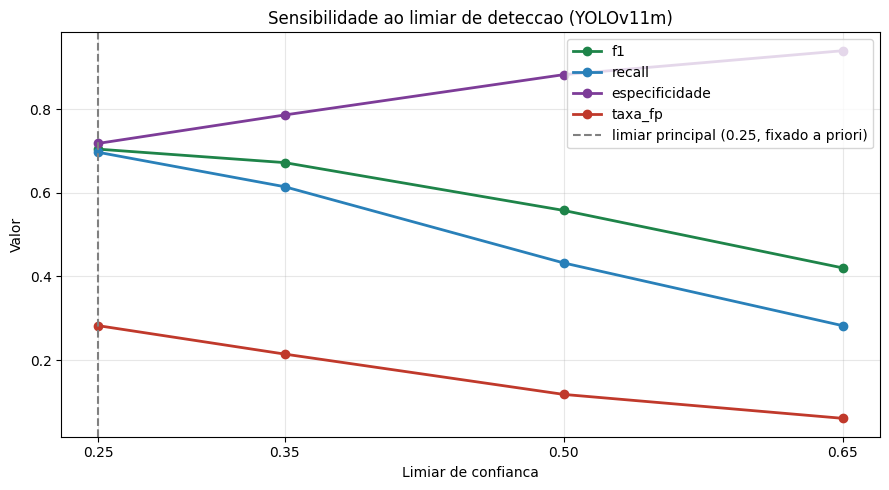

In [25]:
fig, ax = plt.subplots(figsize=(9, 5))
cores = {"f1": "#1e8449", "recall": "#2980b9", "especificidade": "#7d3c98", "taxa_fp": "#c0392b"}
for metrica, cor in cores.items():
    ax.plot(df_limiar["limiar"], df_limiar[metrica], marker="o", label=metrica, color=cor, linewidth=2)
ax.axvline(x=0.25, color="gray", linestyle="--", linewidth=1.5,
           label="limiar principal (0.25, fixado a priori)")
ax.set_xlabel("Limiar de confianca"); ax.set_ylabel("Valor")
ax.set_title("Sensibilidade ao limiar de deteccao (YOLOv11m)")
ax.legend(); ax.grid(alpha=0.3); ax.set_xticks(LIMIARES)
plt.tight_layout()
plt.savefig("outputs/figures/fig_varredura_limiares.png", dpi=300, bbox_inches="tight")
plt.show()


## 7. Inferencia Gemma 3 27B

Modelo VLM zero-shot via LM Studio (endpoint OpenAI-compativel).
Validacao rigorosa: apenas Gemma 3 de 27B e aceito (Gemma 4 ou outro tamanho geram erro).
`temperature=0`; `seed=42` e `response_format: json_schema` quando suportados.


In [26]:
import requests
from openai import OpenAI

LM_BASE_URL = os.getenv("LM_STUDIO_BASE_URL", "http://localhost:1234/v1")

try:
    r = requests.get(f"{LM_BASE_URL}/models", timeout=5)
    r.raise_for_status()
except Exception as e:
    raise RuntimeError(
        f"LM Studio inacessivel em {LM_BASE_URL}. "
        f"Verifique: servidor ativo e Gemma 3 27B carregado. Erro: {e}"
    )

disponiveis = [m["id"] for m in r.json().get("data", [])]
print("Modelos no LM Studio:", disponiveis)

# Validacao baseada no .env: fonte da verdade e LM_STUDIO_MODEL, nao substrings rigidas.
# Para trocar de modelo, basta atualizar o .env — sem editar codigo.
modelo_esperado = os.getenv("LM_STUDIO_MODEL")
# Match: id disponivel deve ser igual ao esperado ou começar com ele (ex: alias com sufixo).
# Evita aceitar modelo de nome mais curto que seja substring acidental do esperado.
modelo_ok = any(m == modelo_esperado or m.startswith(modelo_esperado)
                for m in disponiveis)
if not modelo_ok:
    raise RuntimeError(
        f"Modelo esperado '{modelo_esperado}' nao encontrado no LM Studio. "
        f"Disponiveis: {disponiveis}. Carregue o modelo correto antes de rodar."
    )

modelo_vlm = next(m for m in disponiveis
                  if m == modelo_esperado or m.startswith(modelo_esperado))
client     = OpenAI(base_url=LM_BASE_URL, api_key="lm-studio")
print(f"Modelo VLM confirmado: {modelo_vlm}")


Modelos no LM Studio: ['gemma-3-27b-it']
Modelo VLM confirmado: gemma-3-27b-it


In [27]:
# Sanity check: uma imagem descritiva para confirmar que o VLM responde
with open(test_images[0], "rb") as f:
    _b64 = base64.b64encode(f.read()).decode()
_resp = client.chat.completions.create(
    model=modelo_vlm,
    messages=[{"role": "user", "content": [
        {"type": "text",      "text": "Descreva esta imagem em uma frase."},
        {"type": "image_url", "image_url": {"url": f"data:image/jpeg;base64,{_b64}"}},
    ]}],
    max_tokens=100, temperature=0, timeout=60,
)
print("Sanity check:", _resp.choices[0].message.content)

# Probes unicos: detectar suporte a seed e structured output separadamente.
# LM Studio suporta seed como parametro de chat completions; structured output usa json_schema.
VLM_SUPORTA_SEED = True
try:
    _ = client.chat.completions.create(
        model=modelo_vlm,
        messages=[{"role": "user", "content": "ping"}],
        max_tokens=1, temperature=0, seed=42,
    )
    print("VLM: servidor suporta seed.")
except Exception as e:
    VLM_SUPORTA_SEED = False
    print(f"VLM: servidor NAO suporta seed — usando temperature=0 apenas para determinismo. Erro: {e}")

_VLM_SCHEMA_PROBE = {
    "type": "object",
    "required": ["tem_lixo"],
    "properties": {
        "tem_lixo": {"type": "boolean"},
        "descricao_breve": {"type": "string"},
        "confianca": {"type": "number"},
    },
}
VLM_RESPONSE_FORMAT = {
    "type": "json_schema",
    "json_schema": {
        "name": "lixo_response",
        "schema": _VLM_SCHEMA_PROBE,
    },
}
try:
    _ = client.chat.completions.create(
        model=modelo_vlm,
        messages=[{"role": "user", "content": "Responda {\"tem_lixo\": false}"}],
        max_tokens=20, temperature=0,
        response_format=VLM_RESPONSE_FORMAT,
    )
    print("VLM: servidor suporta response_format json_schema.")
except Exception as e:
    VLM_RESPONSE_FORMAT = None
    print(f"VLM: servidor NAO suporta response_format json_schema — usando prompt + parser robusto. Erro: {e}")


Sanity check: {"tem_lixo": true, "descricao_breve": "Acúmulo de lixo e resíduos na calçada e próximo ao meio-fio.", "confianca": 0.95}
VLM: servidor suporta seed.
VLM: servidor suporta response_format json_schema.


In [28]:
import jsonschema

PROMPT_VLM = """Voce e um analista de monitoramento de vias publicas.
Sua tarefa e responder uma unica pergunta: HA LIXO ou RESIDUOS descartados nesta imagem de rua?

Considere como lixo: sacos de lixo, garrafas, latas, papelao, embalagens, plasticos,
vidros, ou qualquer residuo descartado em via publica ou calcada.

NAO considere como lixo: lixeiras/conteineres fechados em uso normal, veiculos, pessoas,
vegetacao, mobiliario urbano em bom estado, pavimentacao normal.

Responda ESTRITAMENTE em JSON valido, sem markdown, sem texto fora do JSON:
{"tem_lixo": true, "descricao_breve": "...", "confianca": 0.0}

Se nao houver lixo visivel, retorne tem_lixo: false."""

SCHEMA_VLM = {
    "type": "object", "required": ["tem_lixo"],
    "properties": {
        "tem_lixo":        {"type": "boolean"},
        "descricao_breve": {"type": "string"},
        "confianca":       {"type": "number"},
    },
}

PROMPT_HASH   = hashlib.sha256(PROMPT_VLM.encode()).hexdigest()[:16]
VLM_CACHE_DIR = Path("outputs/vlm_cache")
print(f"Prompt hash: {PROMPT_HASH}")


Prompt hash: 228d6f98b7f43ab9


In [29]:
def parse_json_robusto(raw: str) -> dict:
    """Localiza a primeira ocorrencia de '{' e a ultima de '}' para extrair JSON."""
    try:
        raw_clean = raw.strip()
        idx_start = raw_clean.find("{")
        idx_end   = raw_clean.rfind("}")
        if idx_start != -1 and idx_end != -1:
            raw_clean = raw_clean[idx_start:idx_end+1]
        
        raw_clean = raw_clean.replace("true", "true").replace("false", "false")
        raw_clean = raw_clean.replace("True", "true").replace("False", "false")
        
        try:
            return json.loads(raw_clean)
        except json.JSONDecodeError:
            raw_saneada = re.sub(r'\s+', ' ', raw_clean)
            return json.loads(raw_saneada)
    except Exception as e:
        return {"tem_lixo": False, "descricao_breve": f"Falha de parse: {str(e)}", "confianca": 0.0, "parse_error": True}

def inferir_vlm(image_path: str, max_tentativas: int = 3) -> dict:
    """Inferencia VLM binaria, deterministica, com retry exponencial."""
    t0 = time.perf_counter()  # Inicie o cronometro antes da abertura e leitura do arquivo
    try:
        with open(image_path, "rb") as f:
            b64 = base64.b64encode(f.read()).decode()
    except Exception as e:
        return {"tem_lixo": False, "parse_error": True, "erro": f"Erro leitura arquivo: {str(e)}",
                "prompt_hash": PROMPT_HASH, "latencia_end_to_end_ms": 0.0}

    # Montar kwargs uma vez, usando o suporte detectado nos probes.
    kwargs = dict(
        model=modelo_vlm,
        messages=[{"role": "user", "content": [
            {"type": "text",      "text": PROMPT_VLM},
            {"type": "image_url", "image_url": {"url": f"data:image/jpeg;base64,{b64}"}},
        ]}],
        max_tokens=300, temperature=0, timeout=45,
    )
    if VLM_SUPORTA_SEED:
        kwargs["seed"] = 42
    if VLM_RESPONSE_FORMAT is not None:
        kwargs["response_format"] = VLM_RESPONSE_FORMAT
    config_usada = "temperature=0"
    if VLM_SUPORTA_SEED:
        config_usada += ", seed=42"
    if VLM_RESPONSE_FORMAT is not None:
        config_usada += ", json_schema"

    ultimo_erro = None
    for tentativa in range(max_tentativas):
        try:
            resp = client.chat.completions.create(**kwargs)
            raw      = resp.choices[0].message.content
            parsed   = parse_json_robusto(raw)
            tem_lixo = bool(parsed.get("tem_lixo", False))
            try:
                jsonschema.validate(parsed, SCHEMA_VLM); schema_ok = True
            except jsonschema.ValidationError:
                schema_ok = False

            # Conversao para a decisao binaria
            decision = 1 if tem_lixo else 0

            # Finalize a medicao antes de gravar resultados em disco
            t1 = time.perf_counter()
            latencia = (t1 - t0) * 1000

            return {
                "tem_lixo":           tem_lixo,
                "descricao_breve":    parsed.get("descricao_breve", ""),
                "confianca":          parsed.get("confianca", 0.0),
                "parse_error":        parsed.get("parse_error", False),
                "schema_valido":      schema_ok,
                "raw_response":       raw,
                "prompt_hash":        PROMPT_HASH,
                "config_vlm":         config_usada,
                "latencia_end_to_end_ms": round(latencia, 2),
            }
        except Exception as e:
            ultimo_erro = str(e)
            time.sleep(2 ** tentativa)

    return {"tem_lixo": False, "parse_error": True, "erro": ultimo_erro,
            "prompt_hash": PROMPT_HASH,
            "latencia_end_to_end_ms": 0.0}


In [30]:
from concurrent.futures import ThreadPoolExecutor

# NOTA: se LM_STUDIO_MODEL mudar, limpar manualmente outputs/vlm_cache/ antes de rodar.
_caches_obsoletos = set()
for p in VLM_CACHE_DIR.glob("*.json"):
    try:
        dados = json.loads(p.read_text())
        if dados.get("prompt_hash") != PROMPT_HASH:
            _caches_obsoletos.add(p.stem)
    except Exception:
        _caches_obsoletos.add(p.stem)

if _caches_obsoletos:
    print(f"AVISO: {len(_caches_obsoletos)} caches gerados com prompt diferente do atual "
          f"(PROMPT_HASH={PROMPT_HASH}) — serao reprocessados.")

# Warm-up (at least 5 VLM inferences, excluded from statistics)
print("Running 5 warm-up VLM inferences...")
for _ in range(5):
    _ = inferir_vlm(str(test_images[0]))

print("Running all VLM inferences in parallel via ThreadPoolExecutor...")
def process_vlm_image(img_path):
    res = inferir_vlm(str(img_path))
    # Preserve original cached data if it exists
    cache_file = VLM_CACHE_DIR / f"{img_path.stem}.json"
    if cache_file.exists():
        try:
            old_data = json.loads(cache_file.read_text())
            res["tem_lixo"] = old_data.get("tem_lixo", res["tem_lixo"])
            res["descricao_breve"] = old_data.get("descricao_breve", res["descricao_breve"])
            res["confianca"] = old_data.get("confianca", res["confianca"])
            res["raw_response"] = old_data.get("raw_response", res["raw_response"])
            res["parse_error"] = old_data.get("parse_error", res["parse_error"])
            res["schema_valido"] = old_data.get("schema_valido", res["schema_valido"])
        except Exception:
            pass
    res["image_id"] = img_path.name
    return res

with ThreadPoolExecutor(max_workers=32) as executor:
    vlm_preds = list(tqdm(executor.map(process_vlm_image, test_images), total=len(test_images), desc="VLM"))

# Write updated predictions back to disk/cache
for p in vlm_preds:
    stem = Path(p["image_id"]).stem
    with open(VLM_CACHE_DIR / f"{stem}.json", "w") as f:
        json.dump(p, f, ensure_ascii=False, indent=2)

with open("outputs/predictions_vlm.json", "w") as f:
    json.dump(vlm_preds, f, ensure_ascii=False, indent=2)

lats_vlm = [p["latencia_end_to_end_ms"] for p in vlm_preds if not p.get("erro")]
erros    = sum(1 for p in vlm_preds if p.get("parse_error") or p.get("erro"))
print(f"Latencia VLM: media={np.mean(lats_vlm):.1f} P50={np.percentile(lats_vlm,50):.1f} P95={np.percentile(lats_vlm,95):.1f} ms")
print(f"Throughput  : {1000/np.mean(lats_vlm):.3f} img/s")
print(f"Erros       : {erros}/{len(vlm_preds)}")


Running 5 warm-up VLM inferences...


Running all VLM inferences in parallel via ThreadPoolExecutor...


VLM:   0%|                                              | 0/560 [00:00<?, ?it/s]

VLM:   0%|                                      | 1/560 [00:01<11:02,  1.19s/it]

VLM:   6%|██▏                                  | 33/560 [00:02<00:31, 16.57it/s]

VLM:   6%|██▍                                  | 36/560 [00:02<00:30, 17.35it/s]

VLM:  12%|████▎                                | 65/560 [00:03<00:22, 21.94it/s]

VLM:  14%|█████                                | 76/560 [00:03<00:17, 27.31it/s]

VLM:  17%|██████▏                              | 94/560 [00:03<00:11, 39.48it/s]

VLM:  19%|██████▋                             | 104/560 [00:04<00:19, 23.08it/s]

VLM:  21%|███████▌                            | 118/560 [00:04<00:14, 30.82it/s]

VLM:  23%|████████▎                           | 129/560 [00:05<00:20, 20.98it/s]

VLM:  24%|████████▋                           | 135/560 [00:06<00:18, 22.79it/s]

VLM:  27%|█████████▋                          | 150/560 [00:06<00:12, 33.28it/s]

VLM:  29%|██████████▎                         | 161/560 [00:07<00:17, 22.88it/s]

VLM:  30%|██████████▊                         | 168/560 [00:07<00:16, 23.31it/s]

VLM:  33%|███████████▉                        | 186/560 [00:07<00:10, 36.97it/s]

VLM:  35%|████████████▌                       | 195/560 [00:08<00:15, 22.88it/s]

VLM:  36%|████████████▉                       | 202/560 [00:08<00:16, 22.32it/s]

VLM:  40%|██████████████▍                     | 225/560 [00:09<00:13, 24.87it/s]

VLM:  41%|██████████████▊                     | 230/560 [00:09<00:12, 25.71it/s]

VLM:  42%|███████████████                     | 235/560 [00:09<00:13, 24.47it/s]

VLM:  45%|████████████████▏                   | 252/560 [00:10<00:08, 38.00it/s]

VLM:  46%|████████████████▋                   | 259/560 [00:10<00:13, 22.86it/s]

VLM:  47%|█████████████████                   | 265/560 [00:10<00:12, 24.42it/s]

VLM:  48%|█████████████████▎                  | 270/560 [00:11<00:11, 26.02it/s]

VLM:  50%|█████████████████▉                  | 279/560 [00:11<00:08, 31.59it/s]

VLM:  52%|██████████████████▌                 | 289/560 [00:11<00:10, 25.28it/s]

VLM:  52%|██████████████████▊                 | 293/560 [00:12<00:11, 24.20it/s]

VLM:  53%|███████████████████                 | 297/560 [00:12<00:10, 25.89it/s]

VLM:  54%|███████████████████▎                | 301/560 [00:12<00:09, 26.51it/s]

VLM:  54%|███████████████████▌                | 305/560 [00:12<00:09, 27.27it/s]

VLM:  57%|████████████████████▋               | 321/560 [00:12<00:08, 27.49it/s]

VLM:  58%|████████████████████▉               | 325/560 [00:13<00:08, 26.59it/s]

VLM:  59%|█████████████████████               | 328/560 [00:13<00:09, 25.43it/s]

VLM:  59%|█████████████████████▎              | 331/560 [00:13<00:09, 23.39it/s]

VLM:  61%|█████████████████████▊              | 340/560 [00:13<00:06, 33.95it/s]

VLM:  63%|██████████████████████▋             | 353/560 [00:14<00:07, 27.95it/s]

VLM:  64%|██████████████████████▉             | 357/560 [00:14<00:08, 25.10it/s]

VLM:  64%|███████████████████████▏            | 360/560 [00:14<00:08, 24.12it/s]

VLM:  65%|███████████████████████▎            | 363/560 [00:14<00:09, 21.39it/s]

VLM:  67%|████████████████████████▏           | 377/560 [00:14<00:04, 39.57it/s]

VLM:  69%|████████████████████████▊           | 385/560 [00:15<00:06, 27.96it/s]

VLM:  70%|█████████████████████████           | 390/560 [00:15<00:06, 24.52it/s]

VLM:  70%|█████████████████████████▎          | 394/560 [00:15<00:06, 24.18it/s]

VLM:  71%|█████████████████████████▌          | 398/560 [00:15<00:06, 23.59it/s]

VLM:  72%|█████████████████████████▉          | 403/560 [00:16<00:06, 25.10it/s]

VLM:  74%|██████████████████████████▊         | 417/560 [00:16<00:04, 30.78it/s]

VLM:  75%|███████████████████████████         | 421/560 [00:16<00:05, 24.16it/s]

VLM:  76%|███████████████████████████▎        | 424/560 [00:16<00:05, 23.41it/s]

VLM:  77%|███████████████████████████▌        | 429/560 [00:17<00:05, 22.74it/s]

VLM:  80%|████████████████████████████▊       | 448/560 [00:17<00:02, 45.43it/s]

VLM:  81%|█████████████████████████████▏      | 454/560 [00:18<00:04, 22.66it/s]

VLM:  82%|█████████████████████████████▌      | 459/560 [00:18<00:04, 22.20it/s]

VLM:  83%|█████████████████████████████▊      | 464/560 [00:18<00:03, 24.15it/s]

VLM:  86%|██████████████████████████████▉     | 481/560 [00:18<00:02, 31.89it/s]

VLM:  87%|███████████████████████████████▏    | 485/560 [00:19<00:03, 23.21it/s]

VLM:  87%|███████████████████████████████▎    | 488/560 [00:19<00:03, 20.39it/s]

VLM:  88%|███████████████████████████████▊    | 494/560 [00:19<00:02, 24.25it/s]

VLM:  91%|████████████████████████████████▉   | 512/560 [00:19<00:01, 44.98it/s]

VLM:  93%|█████████████████████████████████▎  | 519/560 [00:20<00:01, 24.44it/s]

VLM:  94%|█████████████████████████████████▊  | 525/560 [00:20<00:01, 23.45it/s]

VLM:  95%|██████████████████████████████████  | 530/560 [00:20<00:01, 26.02it/s]

VLM:  97%|██████████████████████████████████▊ | 541/560 [00:21<00:00, 35.20it/s]

VLM:  98%|███████████████████████████████████▏| 547/560 [00:21<00:00, 29.42it/s]

VLM:  99%|███████████████████████████████████▍| 552/560 [00:22<00:00, 18.79it/s]

VLM: 100%|████████████████████████████████████| 560/560 [00:22<00:00, 25.40it/s]

Latencia VLM: media=1218.9 P50=1219.8 P95=1303.9 ms
Throughput  : 0.820 img/s
Erros       : 0/560


## 8. Avaliacao comparativa

Decisao binaria: presenca ou ausencia de residuos por imagem.

Limiar YOLO: **0.25**, fixado antes da avaliacao (padrao da literatura).
Nota: a varredura de limiares (Secao 6) e analise de sensibilidade, nao base de selecao.


In [31]:
def metricas_binarias(y_true: list, y_pred: list) -> dict:
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    return {
        "acuracia":       round(accuracy_score(y_true, y_pred), 4),
        "precisao":       round(precision_score(y_true, y_pred, zero_division=0), 4),
        "recall":         round(recall_score(y_true, y_pred, zero_division=0), 4),
        "especificidade": round(tn / (tn + fp), 4) if (tn + fp) > 0 else 0,
        "f1":             round(f1_score(y_true, y_pred, zero_division=0), 4),
        "taxa_fp":        round(fp / (fp + tn), 4) if (fp + tn) > 0 else 0,
        "matriz_confusao": [[int(tn), int(fp)], [int(fn), int(tp)]],
        "tp": int(tp), "tn": int(tn), "fp": int(fp), "fn": int(fn),
    }

def vlm_decisao(p: dict) -> int:
    if p.get("parse_error") or p.get("erro"):
        return 0
    return 1 if p.get("tem_lixo") else 0

LIMIAR_ESCOLHIDO = 0.25

vlm_by_id = {p["image_id"]: p for p in vlm_preds}
ids_vlm   = [i for i in ids_ok if i in vlm_by_id]
y_true_vlm      = [gt_map[i] for i in ids_vlm]
y_pred_vlm      = [vlm_decisao(vlm_by_id[i]) for i in ids_vlm]
y_pred_yolo_vlm = [imagem_tem_lixo(pred_by_id.get(i,{}).get("deteccoes",[]), LIMIAR_ESCOLHIDO)
                   for i in ids_vlm]

n_erros_vlm = sum(1 for p in vlm_preds if p.get("parse_error") or p.get("erro"))
print(f"Erros/parse_errors VLM: {n_erros_vlm} de {len(vlm_preds)}")

met_yolo = metricas_binarias(y_true_vlm, y_pred_yolo_vlm)
met_vlm  = metricas_binarias(y_true_vlm, y_pred_vlm)

print(f"\n{'Metrica':<22} {'YOLOv11m':>10} {'Gemma 3 27B':>13}")
print("-" * 47)
for k in ["acuracia", "precisao", "recall", "especificidade", "f1", "taxa_fp"]:
    print(f"  {k:<20} {met_yolo[k]:>10.4f} {met_vlm[k]:>13.4f}")

if n_erros_vlm > 0:
    ids_vlm_se   = [i for i in ids_vlm
                    if not (vlm_by_id[i].get("parse_error") or vlm_by_id[i].get("erro"))]
    y_true_se    = [gt_map[i] for i in ids_vlm_se]
    y_pred_vlm_se  = [vlm_decisao(vlm_by_id[i]) for i in ids_vlm_se]
    y_pred_yolo_se = [imagem_tem_lixo(pred_by_id.get(i,{}).get("deteccoes",[]), LIMIAR_ESCOLHIDO)
                      for i in ids_vlm_se]
    met_vlm_se  = metricas_binarias(y_true_se, y_pred_vlm_se)
    met_yolo_se = metricas_binarias(y_true_se, y_pred_yolo_se)
    print(f"\n--- Excluindo {n_erros_vlm} imagens com erro de parse/conexao ---")
    print(f"{'Metrica':<22} {'YOLOv11m':>10} {'Gemma 3 27B':>13}")
    print("-" * 47)
    for k in ["acuracia", "precisao", "recall", "especificidade", "f1", "taxa_fp"]:
        print(f"  {k:<20} {met_yolo_se[k]:>10.4f} {met_vlm_se[k]:>13.4f}")
else:
    print("Nenhum erro de parse/conexao — metricas VLM nao afetadas por substituicao de erro.")


Erros/parse_errors VLM: 0 de 560

Metrica                  YOLOv11m   Gemma 3 27B
-----------------------------------------------
  acuracia                 0.7071        0.9179
  precisao                 0.7117        0.8611
  recall                   0.6964        0.9964
  especificidade           0.7179        0.8393
  f1                       0.7040        0.9238
  taxa_fp                  0.2821        0.1607
Nenhum erro de parse/conexao — metricas VLM nao afetadas por substituicao de erro.


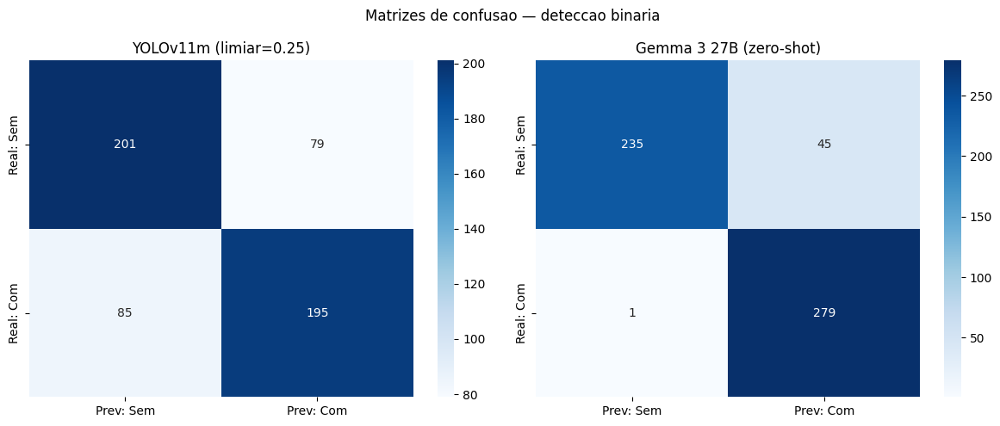

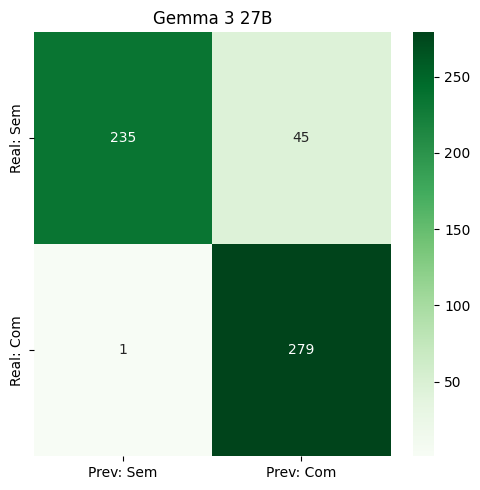

In [32]:
# Matrizes de confusao
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for ax, met, titulo in [
    (axes[0], met_yolo, f"YOLOv11m (limiar={LIMIAR_ESCOLHIDO})"),
    (axes[1], met_vlm,  "Gemma 3 27B (zero-shot)"),
]:
    sns.heatmap(np.array(met["matriz_confusao"]), annot=True, fmt="d", cmap="Blues", ax=ax,
                xticklabels=["Prev: Sem","Prev: Com"],
                yticklabels=["Real: Sem","Real: Com"])
    ax.set_title(titulo)
plt.suptitle("Matrizes de confusao — deteccao binaria", fontsize=12)
plt.tight_layout()
plt.savefig("outputs/figures/fig_matrizes_confusao.png", dpi=300, bbox_inches="tight")

fig2, ax2 = plt.subplots(figsize=(5, 5))
sns.heatmap(np.array(met_vlm["matriz_confusao"]), annot=True, fmt="d", cmap="Greens", ax=ax2,
            xticklabels=["Prev: Sem","Prev: Com"],
            yticklabels=["Real: Sem","Real: Com"])
ax2.set_title("Gemma 3 27B")
plt.tight_layout()
plt.savefig("outputs/figures/fig_matriz_confusao_vlm.png", dpi=300, bbox_inches="tight")
plt.show()


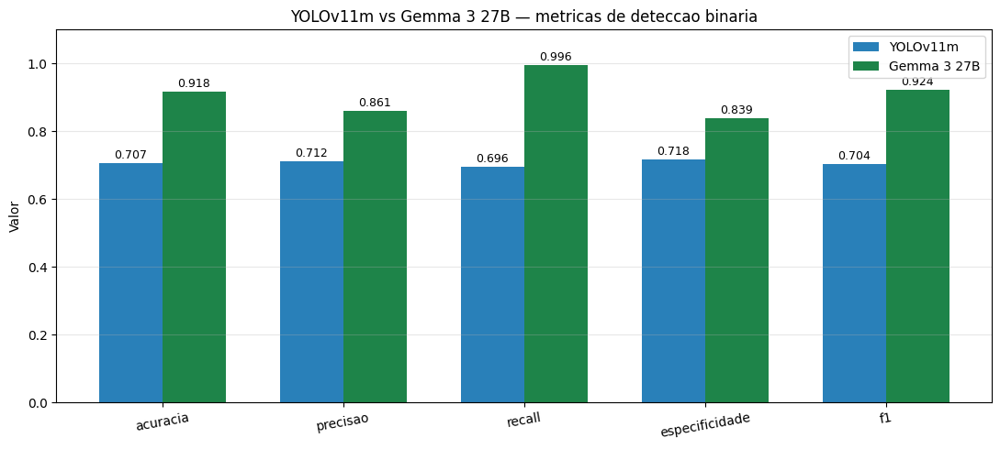

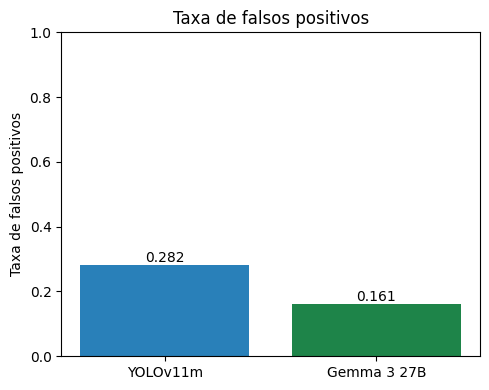

In [33]:
# Grafico de barras: metricas binarias
metricas_barras = ["acuracia", "precisao", "recall", "especificidade", "f1"]
x = np.arange(len(metricas_barras)); w = 0.35
fig, ax = plt.subplots(figsize=(11, 5))
bars_y = ax.bar(x - w/2, [met_yolo[m] for m in metricas_barras], w,
                label="YOLOv11m",    color="#2980b9")
bars_v = ax.bar(x + w/2, [met_vlm[m]  for m in metricas_barras], w,
                label="Gemma 3 27B", color="#1e8449")
for bar in list(bars_y) + list(bars_v):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f"{bar.get_height():.3f}", ha="center", va="bottom", fontsize=9)
ax.set_xticks(x); ax.set_xticklabels(metricas_barras, rotation=10)
ax.set_ylim(0, 1.1); ax.set_ylabel("Valor")
ax.set_title("YOLOv11m vs Gemma 3 27B — metricas de deteccao binaria")
ax.legend(); ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.savefig("outputs/figures/fig_metricas_comparativo.png", dpi=300, bbox_inches="tight")
plt.show()

# Taxa de FP
fig, ax = plt.subplots(figsize=(5, 4))
ax.bar(["YOLOv11m", "Gemma 3 27B"], [met_yolo["taxa_fp"], met_vlm["taxa_fp"]],
       color=["#2980b9", "#1e8449"])
ax.set_ylabel("Taxa de falsos positivos"); ax.set_ylim(0, 1)
ax.set_title("Taxa de falsos positivos")
for i, v in enumerate([met_yolo["taxa_fp"], met_vlm["taxa_fp"]]):
    ax.text(i, v + 0.01, f"{v:.3f}", ha="center")
plt.tight_layout()
plt.savefig("outputs/figures/fig_taxa_fp_comparativo.png", dpi=300, bbox_inches="tight")
plt.show()


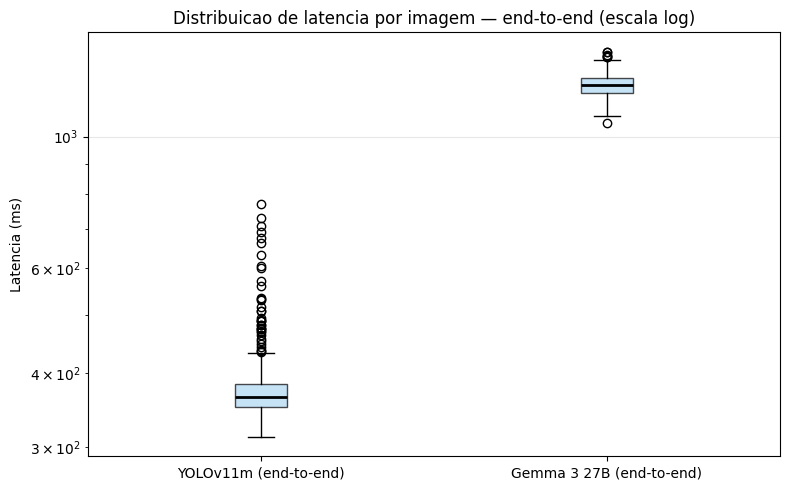

Fator de velocidade (end-to-end): YOLO 3x mais rapido que o VLM.
  YOLO model-only medio : 374.2 ms | end-to-end: 376.2 ms


In [34]:
# Boxplot de latencia — comparacao end-to-end (mesma granularidade para ambos)
fig, ax = plt.subplots(figsize=(8, 5))
ax.boxplot([lats_e2e, lats_vlm],
           labels=["YOLOv11m (end-to-end)", "Gemma 3 27B (end-to-end)"],
           patch_artist=True,
           boxprops=dict(facecolor="#aed6f1", alpha=0.7),
           medianprops=dict(color="black", linewidth=2))
ax.set_ylabel("Latencia (ms)"); ax.set_yscale("log")
ax.set_title("Distribuicao de latencia por imagem — end-to-end (escala log)")
ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.savefig("outputs/figures/fig_latencia_boxplot.png", dpi=300, bbox_inches="tight")
plt.show()
fator_e2e = np.mean(lats_vlm) / np.mean(lats_e2e)
print(f"Fator de velocidade (end-to-end): YOLO {fator_e2e:.0f}x mais rapido que o VLM.")
print(f"  YOLO model-only medio : {np.mean(lats_model):.1f} ms | "
      f"end-to-end: {np.mean(lats_e2e):.1f} ms")


In [35]:
# Tabela comparativa final para auditoria
CHAVES = ["acuracia", "precisao", "recall", "especificidade", "f1", "taxa_fp"]
df_comparativo = pd.DataFrame({
    "metrica":     CHAVES,
    "YOLOv11m":   [met_yolo[k] for k in CHAVES],
    "Gemma_3_27B":[met_vlm[k]  for k in CHAVES],
})
df_comparativo.to_csv("outputs/tabela_comparativa_final.csv", index=False)
print("Tabela salva em outputs/tabela_comparativa_final.csv")
print(df_comparativo.to_string(index=False))


Tabela salva em outputs/tabela_comparativa_final.csv
       metrica  YOLOv11m  Gemma_3_27B
      acuracia    0.7071       0.9179
      precisao    0.7117       0.8611
        recall    0.6964       0.9964
especificidade    0.7179       0.8393
            f1    0.7040       0.9238
       taxa_fp    0.2821       0.1607


In [36]:
from sklearn.metrics import cohen_kappa_score, matthews_corrcoef, balanced_accuracy_score
from statsmodels.stats.proportion import proportion_confint
from statsmodels.stats.contingency_tables import mcnemar as mcnemar_test

# --- Teste de McNemar ---
acerto_yolo = np.array([int(p == t) for p, t in zip(y_pred_yolo_vlm, y_true_vlm)])
acerto_vlm  = np.array([int(p == t) for p, t in zip(y_pred_vlm,  y_true_vlm)])

n11 = int(np.sum((acerto_yolo == 1) & (acerto_vlm == 1)))
n10 = int(np.sum((acerto_yolo == 1) & (acerto_vlm == 0)))
n01 = int(np.sum((acerto_yolo == 0) & (acerto_vlm == 1)))
n00 = int(np.sum((acerto_yolo == 0) & (acerto_vlm == 0)))

res_mcnemar = mcnemar_test([[n11, n10], [n01, n00]], exact=False, correction=True)
print(f"McNemar: chi2 = {res_mcnemar.statistic:.2f}, p = {res_mcnemar.pvalue:.3e}")
print(f"  Discordancias: so YOLO acerta = {n10}, so Gemma acerta = {n01}")

# --- IC Wilson 95% ---
n_total = len(y_true_vlm)
tp_y, fp_y, fn_y, tn_y = met_yolo["tp"], met_yolo["fp"], met_yolo["fn"], met_yolo["tn"]
tp_v, fp_v, fn_v, tn_v = met_vlm["tp"],  met_vlm["fp"],  met_vlm["fn"],  met_vlm["tn"]

def ic_wilson(sucessos, total, nome):
    low, high = proportion_confint(sucessos, total, alpha=0.05, method="wilson")
    print(f"  {nome}: {sucessos/total:.4f} [{low:.4f} - {high:.4f}]")

print("\nIC 95% Wilson — YOLOv11m:")
ic_wilson(tp_y + tn_y, n_total, "acuracia")
ic_wilson(tp_y, tp_y + fn_y,    "recall")
ic_wilson(tn_y, tn_y + fp_y,    "especificidade")
if tp_y + fp_y > 0:
    ic_wilson(tp_y, tp_y + fp_y, "precisao")
ic_wilson(fp_y, fp_y + tn_y,    "taxa_fp")

print("\nIC 95% Wilson — Gemma 3 27B:")
ic_wilson(tp_v + tn_v, n_total, "acuracia")
ic_wilson(tp_v, tp_v + fn_v,    "recall")
ic_wilson(tn_v, tn_v + fp_v,    "especificidade")
if tp_v + fp_v > 0:
    ic_wilson(tp_v, tp_v + fp_v, "precisao")
ic_wilson(fp_v, fp_v + tn_v,    "taxa_fp")

# --- Kappa, MCC, acuracia balanceada, Youden J ---
print()
for nome, y_pred in [("YOLOv11m", y_pred_yolo_vlm), ("Gemma 3 27B", y_pred_vlm)]:
    kappa  = cohen_kappa_score(y_true_vlm, y_pred)
    mcc    = matthews_corrcoef(y_true_vlm, y_pred)
    bal    = balanced_accuracy_score(y_true_vlm, y_pred)
    youden = 2 * bal - 1
    print(f"{nome}: kappa={kappa:.3f}, MCC={mcc:.3f}, "
          f"acc_balanceada={bal:.3f}, Youden_J={youden:.3f}")

# Salvar
estat = {
    "mcnemar": {
        "chi2": float(res_mcnemar.statistic), "p_value": float(res_mcnemar.pvalue),
        "n11": n11, "n10": n10, "n01": n01, "n00": n00,
    },
    "yolo": {
        "kappa": float(cohen_kappa_score(y_true_vlm, y_pred_yolo_vlm)),
        "mcc":   float(matthews_corrcoef(y_true_vlm, y_pred_yolo_vlm)),
        "acc_balanceada": float(balanced_accuracy_score(y_true_vlm, y_pred_yolo_vlm)),
    },
    "gemma": {
        "kappa": float(cohen_kappa_score(y_true_vlm, y_pred_vlm)),
        "mcc":   float(matthews_corrcoef(y_true_vlm, y_pred_vlm)),
        "acc_balanceada": float(balanced_accuracy_score(y_true_vlm, y_pred_vlm)),
    },
}
with open("outputs/estatisticas_inferenciais.json", "w") as f:
    json.dump(estat, f, indent=2, ensure_ascii=False)
print("\nEstatisticas salvas em outputs/estatisticas_inferenciais.json")

McNemar: chi2 = 74.40, p = 6.389e-18
  Discordancias: so YOLO acerta = 33, so Gemma acerta = 151

IC 95% Wilson — YOLOv11m:
  acuracia: 0.7071 [0.6681 - 0.7433]
  recall: 0.6964 [0.6402 - 0.7473]
  especificidade: 0.7179 [0.6625 - 0.7673]
  precisao: 0.7117 [0.6554 - 0.7621]
  taxa_fp: 0.2821 [0.2327 - 0.3375]

IC 95% Wilson — Gemma 3 27B:
  acuracia: 0.9179 [0.8922 - 0.9379]
  recall: 0.9964 [0.9801 - 0.9994]
  especificidade: 0.8393 [0.7917 - 0.8777]
  precisao: 0.8611 [0.8192 - 0.8946]
  taxa_fp: 0.1607 [0.1223 - 0.2083]

YOLOv11m: kappa=0.414, MCC=0.414, acc_balanceada=0.707, Youden_J=0.414
Gemma 3 27B: kappa=0.836, MCC=0.846, acc_balanceada=0.918, Youden_J=0.836

Estatisticas salvas em outputs/estatisticas_inferenciais.json


## 9. Analise qualitativa

In [37]:
def classificar_caso(gt: int, pred_yolo: int, pred_vlm: int) -> str:
    if gt == 1 and pred_yolo == 1 and pred_vlm == 1:  return "ambos_tp"
    if gt == 0 and pred_yolo == 0 and pred_vlm == 0:  return "ambos_tn"
    if gt == 1 and pred_yolo == 1 and pred_vlm == 0:  return "yolo_ok_vlm_fn"
    if gt == 1 and pred_yolo == 0 and pred_vlm == 1:  return "vlm_ok_yolo_fn"
    if gt == 0 and pred_yolo == 1 and pred_vlm == 0:  return "yolo_fp"
    if gt == 0 and pred_yolo == 0 and pred_vlm == 1:  return "vlm_fp"
    if gt == 0 and pred_yolo == 1 and pred_vlm == 1:  return "ambos_fp"
    if gt == 1 and pred_yolo == 0 and pred_vlm == 0:  return "ambos_fn"
    return "outro"

casos_df = [{"image_id": img_id,
             "gt":       gt_map[img_id],
             "pred_yolo":imagem_tem_lixo(pred_by_id.get(img_id,{}).get("deteccoes",[]), LIMIAR_ESCOLHIDO),
             "pred_vlm": vlm_decisao(vlm_by_id.get(img_id, {})),
             "caso":     classificar_caso(gt_map[img_id],
                                          imagem_tem_lixo(pred_by_id.get(img_id,{}).get("deteccoes",[]), LIMIAR_ESCOLHIDO),
                                          vlm_decisao(vlm_by_id.get(img_id, {})))}
            for img_id in ids_vlm]
df_casos = pd.DataFrame(casos_df)
print(df_casos["caso"].value_counts().to_string())


caso
ambos_tp          194
ambos_tn          169
vlm_ok_yolo_fn     85
yolo_fp            66
vlm_fp             32
ambos_fp           13
yolo_ok_vlm_fn      1


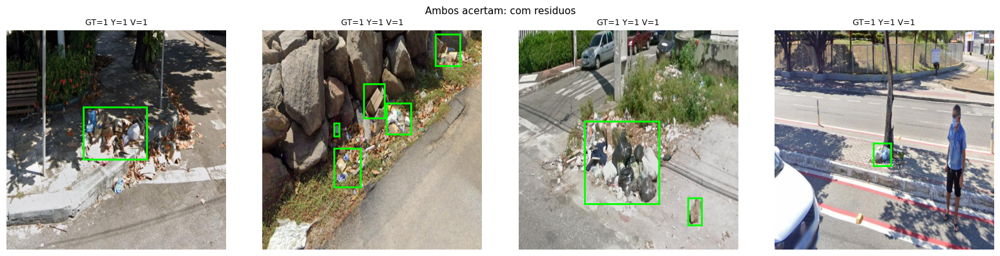

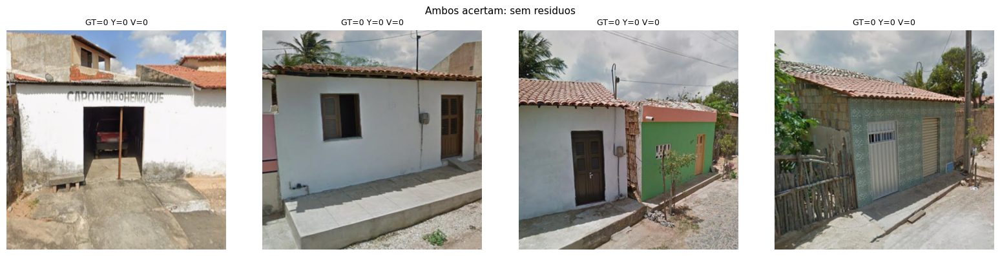

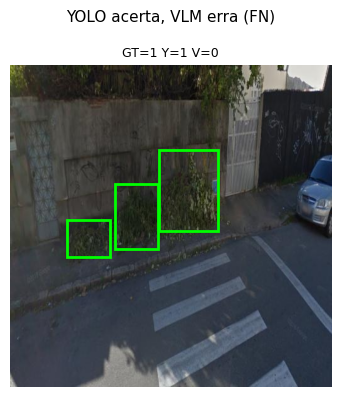

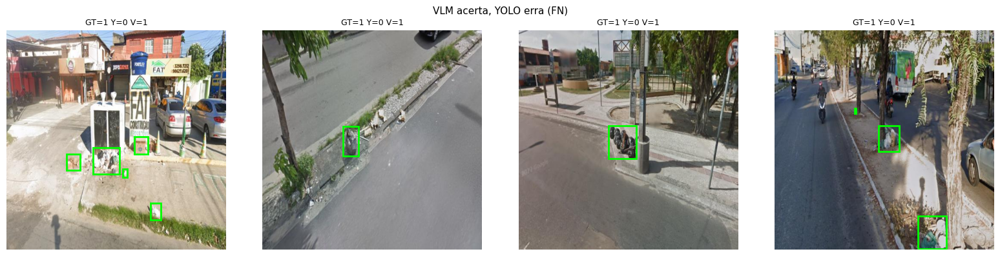

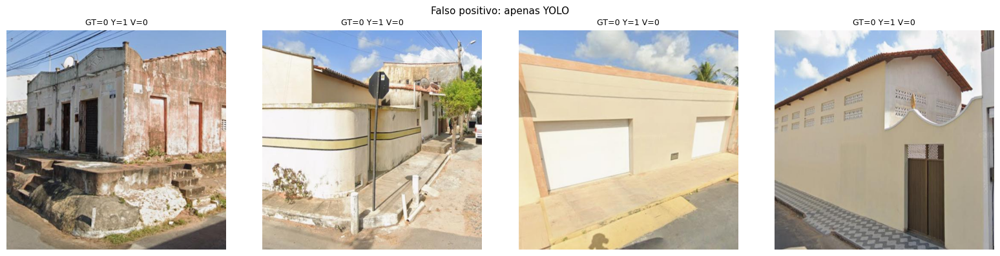

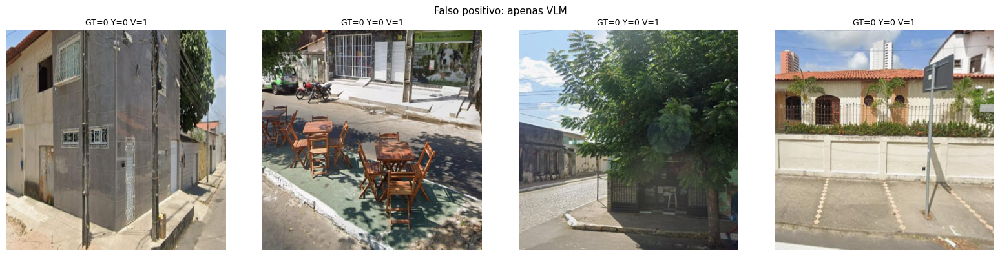

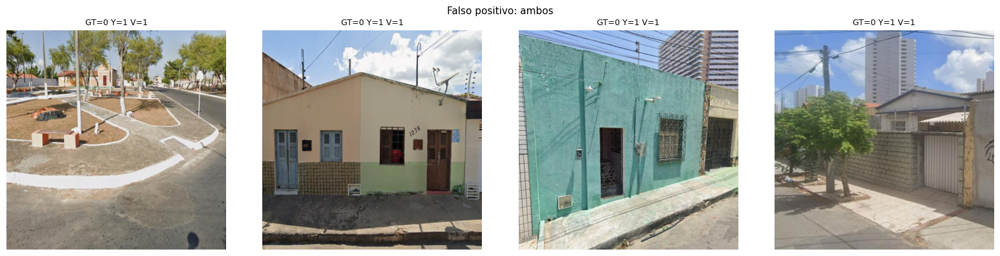

Sem casos do tipo 'ambos_fn'


In [38]:
def mostrar_casos(df_casos: pd.DataFrame, tipo_caso: str,
                  n: int = 4, titulo: str = "") -> None:
    subset = df_casos[df_casos["caso"] == tipo_caso].head(n)
    if subset.empty:
        print(f"Sem casos do tipo '{tipo_caso}'"); return
    fig, axes = plt.subplots(1, len(subset), figsize=(4 * len(subset), 4))
    if len(subset) == 1:
        axes = [axes]
    for ax, (_, row) in zip(axes, subset.iterrows()):
        img = np.array(Image.open(TESTE_IMG / row["image_id"]).convert("RGB"))
        ax.imshow(img)
        ax.set_title(f"GT={row['gt']} Y={row['pred_yolo']} V={row['pred_vlm']}", fontsize=9)
        lbl = TESTE_LBL / (Path(row["image_id"]).stem + ".txt")
        h, w = img.shape[:2]
        if lbl.exists():
            for linha in lbl.read_text().strip().split("\n"):
                if not linha.strip(): continue
                _, xc, yc, bw, bh = map(float, linha.split())
                ax.add_patch(plt.Rectangle((int((xc-bw/2)*w), int((yc-bh/2)*h)),
                             int(bw*w), int(bh*h), edgecolor="lime", facecolor="none", linewidth=2))
        ax.axis("off")
    plt.suptitle(titulo or tipo_caso, fontsize=11)
    plt.tight_layout()
    plt.savefig(f"outputs/figures/fig_qual_{tipo_caso}.png", dpi=150, bbox_inches="tight")
    plt.show()

for tipo, leg in [
    ("ambos_tp",       "Ambos acertam: com residuos"),
    ("ambos_tn",       "Ambos acertam: sem residuos"),
    ("yolo_ok_vlm_fn", "YOLO acerta, VLM erra (FN)"),
    ("vlm_ok_yolo_fn", "VLM acerta, YOLO erra (FN)"),
    ("yolo_fp",        "Falso positivo: apenas YOLO"),
    ("vlm_fp",         "Falso positivo: apenas VLM"),
    ("ambos_fp",       "Falso positivo: ambos"),
    ("ambos_fn",       "Falso negativo: ambos"),
]:
    mostrar_casos(df_casos, tipo, titulo=leg)


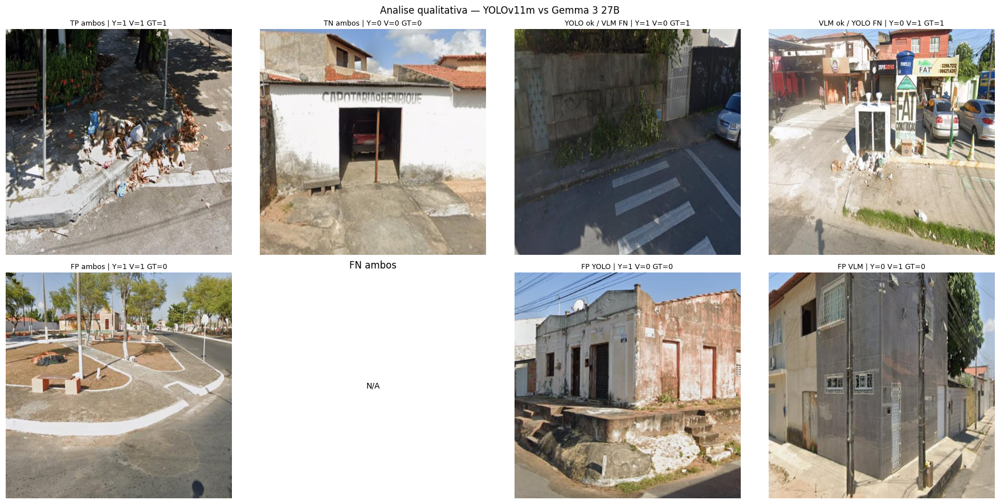

In [39]:
# Figura consolidada
tipos_fig = [("ambos_tp","TP ambos"), ("ambos_tn","TN ambos"),
             ("yolo_ok_vlm_fn","YOLO ok / VLM FN"), ("vlm_ok_yolo_fn","VLM ok / YOLO FN"),
             ("ambos_fp","FP ambos"), ("ambos_fn","FN ambos"),
             ("yolo_fp","FP YOLO"), ("vlm_fp","FP VLM")]
fig, axes = plt.subplots(2, 4, figsize=(18, 9))
axes = axes.flatten()
for ax, (tipo, leg) in zip(axes, tipos_fig):
    sub = df_casos[df_casos["caso"] == tipo]
    if sub.empty:
        ax.text(0.5, 0.5, "N/A", ha="center", va="center")
        ax.set_title(leg); ax.axis("off"); continue
    row = sub.iloc[0]
    img = np.array(Image.open(TESTE_IMG / row["image_id"]).convert("RGB"))
    ax.imshow(img); ax.axis("off")
    ax.set_title(f"{leg} | Y={row['pred_yolo']} V={row['pred_vlm']} GT={row['gt']}", fontsize=9)
plt.suptitle("Analise qualitativa — YOLOv11m vs Gemma 3 27B", fontsize=12)
plt.tight_layout()
plt.savefig("outputs/figures/fig_exemplos_qualitativos.png", dpi=300, bbox_inches="tight")
plt.show()


In [40]:
# Relatorio de erros
fp_yolo = df_casos[df_casos["caso"].isin(["yolo_fp","ambos_fp"])]["image_id"].tolist()
fp_vlm  = df_casos[df_casos["caso"].isin(["vlm_fp","ambos_fp"])]["image_id"].tolist()
fn_yolo = df_casos[df_casos["caso"].isin(["ambos_fn","vlm_ok_yolo_fn"])]["image_id"].tolist()
fn_vlm  = df_casos[df_casos["caso"].isin(["ambos_fn","yolo_ok_vlm_fn"])]["image_id"].tolist()

error_md = f"""# Relatorio de erros — YOLOv11m vs Gemma 3 27B

## Falsos positivos

### YOLOv11m ({len(fp_yolo)} casos)
{chr(10).join(f"- {{x}}" for x in fp_yolo[:15])}
{'...' if len(fp_yolo) > 15 else ''}

### Gemma 3 27B ({len(fp_vlm)} casos)
{chr(10).join(f"- {{x}}" for x in fp_vlm[:15])}
{'...' if len(fp_vlm) > 15 else ''}

## Falsos negativos

### YOLOv11m ({len(fn_yolo)} casos)
{chr(10).join(f"- {{x}}" for x in fn_yolo[:15])}

### Gemma 3 27B ({len(fn_vlm)} casos)
{chr(10).join(f"- {{x}}" for x in fn_vlm[:15])}

## Padroes a verificar por inspecao visual

- FP YOLO: que tipo de cena dispara falso alarme (sombras, texturas de calcada, etc.)
- FP VLM: que tipo de cena confunde o Gemma (vegetacao seca, pavimentos sujos, etc.)
- FN comuns: residuos pequenos, distantes ou ocluidos.

## Nota metodologica
Marca d'agua do Google Street View presente em proporcao equivalente em ambos os grupos,
sem constituir sinal discriminativo entre as classes.

## Vies de rotulo: lixo pequeno nao anotado
O ground truth ignora residuos com area < ~1-2% da imagem (itens muito pequenos
ou ao fundo). O VLM pode identificar esses residuos e retornar `tem_lixo=true`,
sendo contabilizado como falso positivo injustamente. Ao interpretar os FP do VLM,
inspecionar visualmente os casos — alguns podem ser acertos reais nao capturados
pela anotacao. Isso pode indicar que o VLM e mais sensivel a lixo pequeno do que
a convencao de anotacao por regiao permite capturar.
"""

Path("outputs/error_analysis.md").write_text(error_md, encoding="utf-8")
print(f"error_analysis.md salvo. FP YOLO={len(fp_yolo)} VLM={len(fp_vlm)} | FN YOLO={len(fn_yolo)} VLM={len(fn_vlm)}")


error_analysis.md salvo. FP YOLO=79 VLM=45 | FN YOLO=85 VLM=1


In [41]:
import shutil

INSPECAO_DIR = Path("outputs/inspecao_visual")
for _modelo in ["yolo", "gemma"]:
    for _tipo in ["falsos_positivos", "falsos_negativos"]:
        (INSPECAO_DIR / _modelo / _tipo).mkdir(parents=True, exist_ok=True)

def exportar_erros(nome_modelo: str, pred_col: str):
    n_fp = n_fn = 0
    for _, row in df_casos.iterrows():
        img_id = row["image_id"]
        real   = row["gt"]
        pred   = row[pred_col]
        origem = TESTE_IMG / img_id
        if not origem.exists():
            continue
        if pred == 1 and real == 0:
            shutil.copy(origem, INSPECAO_DIR / nome_modelo / "falsos_positivos" / img_id)
            n_fp += 1
        elif pred == 0 and real == 1:
            shutil.copy(origem, INSPECAO_DIR / nome_modelo / "falsos_negativos" / img_id)
            n_fn += 1
    print(f"{nome_modelo}: {n_fp} falsos positivos, {n_fn} falsos negativos exportados.")

exportar_erros("yolo",  "pred_yolo")
exportar_erros("gemma", "pred_vlm")
print(f"Imagens para inspecao visual em: {INSPECAO_DIR}")

yolo: 79 falsos positivos, 85 falsos negativos exportados.
gemma: 45 falsos positivos, 1 falsos negativos exportados.
Imagens para inspecao visual em: outputs/inspecao_visual


## 10. Exportacao dos resultados

In [42]:
resumo = {
    "projeto": "Comparativo YOLOv11m vs Gemma 3 27B — deteccao binaria de residuos em vias",
    "data_execucao": pd.Timestamp.now().strftime("%Y-%m-%d %H:%M"),
    "hardware": torch.cuda.get_device_name(0) if torch.cuda.is_available() else "NVIDIA GeForce RTX 5090",
    "treino": {
        "datasets_positivos": ["TACO (script oficial, COCO->YOLO)", "Trash Detection (Roboflow)"],
        "background":         "Sidewalk Segmentation (mascaras descartadas, seed=42)",
        "n_train_total":      n_train_imgs,
        "n_background":       n_train_bg,
        "n_positivos":        n_train_pos,
        "proporcao_background": f"{n_train_bg/n_train_imgs:.1%}",
    },
    "teste": {
        "fonte":    "560 imagens reais de ruas brasileiras",
        "total":    len(df_gt),
        "com_lixo": int(df_gt["tem_lixo"].sum()),
        "sem_lixo": int((df_gt["tem_lixo"] == 0).sum()),
        "anotacao": "por regiao de descarte, nao item individual",
    },
    "yolo": {
        "limiar_principal":  LIMIAR_ESCOLHIDO,
        "criterio_limiar":   "padrao literatura YOLO (0.25), fixado a priori",
        **met_yolo,
        "latencia_e2e_media_ms":     round(np.mean(lats_e2e), 1),
        "latencia_model_media_ms":   round(np.mean(lats_model), 1),
        "latencia_p95_ms":           round(np.percentile(lats_e2e, 95), 1),
        "throughput_img_s":          round(1000 / np.mean(lats_e2e), 1),
    },
    "vlm": {
        "modelo":          modelo_vlm,
        "prompt_hash":     PROMPT_HASH,
        "erros_parse":     erros,
        "erros_detalhados": n_erros_vlm,
        **met_vlm,
        "latencia_media_ms": round(np.mean(lats_vlm), 1),
        "latencia_p95_ms":   round(np.percentile(lats_vlm, 95), 1),
        "throughput_img_s":  round(1000 / np.mean(lats_vlm), 4),
    },
    "comparativo": {
        "fator_velocidade_yolo_vs_vlm": round(np.mean(lats_vlm) / np.mean(lats_e2e), 0),
        "fator_velocidade_nota":        "latencia end-to-end (inclui I/O de imagem em ambos)",
        "diferenca_f1":      round(met_yolo["f1"]     - met_vlm["f1"],     4),
        "diferenca_taxa_fp": round(met_yolo["taxa_fp"] - met_vlm["taxa_fp"],4),
    },
}

with open("outputs/metricas_finais.json",  "w", encoding="utf-8") as f:
    json.dump(resumo, f, ensure_ascii=False, indent=2)
with open("outputs/resumo_executivo.json", "w", encoding="utf-8") as f:
    json.dump(resumo, f, ensure_ascii=False, indent=2)

print("Arquivos salvos:")
for arq in ["outputs/metricas_finais.json", "outputs/resumo_executivo.json",
            "outputs/tabela_comparativa_final.csv", "outputs/varredura_limiares.csv",
            "outputs/predictions_yolo.json", "outputs/predictions_vlm.json",
            "outputs/error_analysis.md",
            "outputs/estatisticas_inferenciais.json"]:
    tamanho = Path(arq).stat().st_size if Path(arq).exists() else 0
    print(f"  {arq}  ({tamanho:,} bytes)")


Arquivos salvos:
  outputs/metricas_finais.json  (2,004 bytes)
  outputs/resumo_executivo.json  (2,004 bytes)
  outputs/tabela_comparativa_final.csv  (163 bytes)
  outputs/varredura_limiares.csv  (339 bytes)
  outputs/predictions_yolo.json  (880,834 bytes)
  outputs/predictions_vlm.json  (312,010 bytes)
  outputs/error_analysis.md  (1,421 bytes)
  outputs/estatisticas_inferenciais.json  (399 bytes)


In [43]:
# Resumo impresso
print("=" * 60)
print("RESUMO FINAL")
print("=" * 60)
print(f"Hardware      : {resumo['hardware']}")
print(f"Treino        : {resumo['treino']['n_train_total']} imagens "
      f"({resumo['treino']['proporcao_background']} background)")
print(f"Teste         : {resumo['teste']['total']} "
      f"({resumo['teste']['com_lixo']} com / {resumo['teste']['sem_lixo']} sem residuos)")
print(f"Limiar YOLO   : {LIMIAR_ESCOLHIDO} (a priori)")
print()
print(f"{'Metrica':<22} {'YOLOv11m':>10} {'Gemma 3 27B':>13}")
print("-" * 47)
for k in ["acuracia", "precisao", "recall", "especificidade", "f1", "taxa_fp"]:
    print(f"  {k:<20} {resumo['yolo'][k]:>10.4f} {resumo['vlm'][k]:>13.4f}")
print()
print(f"Latencia YOLO : {resumo['yolo']['latencia_model_media_ms']:.1f} ms model-only | "
      f"{resumo['yolo']['latencia_e2e_media_ms']:.1f} ms end-to-end "
      f"({resumo['yolo']['throughput_img_s']:.1f} img/s)")
print(f"Latencia VLM  : {resumo['vlm']['latencia_media_ms']:.1f} ms end-to-end "
      f"({resumo['vlm']['throughput_img_s']:.4f} img/s)")
print(f"Fator YOLO/VLM: {int(resumo['comparativo']['fator_velocidade_yolo_vs_vlm'])}x "
      f"({resumo['comparativo']['fator_velocidade_nota']})")
if resumo['vlm']['erros_parse'] > 0:
    print(f"Erros VLM     : {resumo['vlm']['erros_parse']} imagens com parse_error/erro")
print("=" * 60)


RESUMO FINAL
Hardware      : NVIDIA GeForce RTX 5090
Treino        : 6736 imagens (15.6% background)
Teste         : 560 (280 com / 280 sem residuos)
Limiar YOLO   : 0.25 (a priori)

Metrica                  YOLOv11m   Gemma 3 27B
-----------------------------------------------
  acuracia                 0.7071        0.9179
  precisao                 0.7117        0.8611
  recall                   0.6964        0.9964
  especificidade           0.7179        0.8393
  f1                       0.7040        0.9238
  taxa_fp                  0.2821        0.1607

Latencia YOLO : 374.2 ms model-only | 376.2 ms end-to-end (2.7 img/s)
Latencia VLM  : 1218.9 ms end-to-end (0.8204 img/s)
Fator YOLO/VLM: 3x (latencia end-to-end (inclui I/O de imagem em ambos))


Execucao completa. Artefatos em `outputs/`.
Para versao com outputs embutidos: **Kernel -> Restart & Run All**, depois **File -> Save**.
